<a href="https://colab.research.google.com/github/ParshinAD/uhaifa_stat_learning/blob/main/TimePredictionTask.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [1]:
# Core libraries
import numpy as np
import pandas as pd
import re

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statsmodels
import statsmodels.api as sm
from statsmodels.api import OLS

# Scikit-learn: preprocessing
from sklearn.preprocessing import StandardScaler

# Scikit-learn: model selection
from sklearn.model_selection import KFold, train_test_split
import sklearn.model_selection as skm  # if needed for specific functions

# Scikit-learn: regression models
from sklearn.linear_model import LassoCV, RidgeCV, Ridge, Lasso
from sklearn.linear_model import LinearRegression  # if needed
import sklearn.linear_model as skl  # if needed for generic access

# Scikit-learn: metrics
from sklearn.metrics import mean_squared_error, r2_score

# Scikit-learn: decomposition and PLS
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

# Scikit-learn: ensemble and tree-based models
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

# Dataset creation (for synthetic examples)
from sklearn.datasets import make_regression

# Optional external packages (commented if not installed)
# from ISLP.models import Stepwise, sklearn_selected, sklearn_selection_path
# from l0bnb import fit_path


# Load data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
##Load the dataset:
df_partial = pd.read_csv("/content/drive/MyDrive/UHAIFA/content_output.csv")
#60083
df_partial.head()

,action,observation.state,timestamp,frame_index,episode_index,index,task_index
0,[ 0.05824046 0.10764965 -0.10220728 -0.067425...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.000000,0,0,0,0
1,[ 0.05823839 0.1076455 -0.10220364 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.033333,1,0,1,0
2,[ 0.05823861 0.10764543 -0.10220361 -0.067423...,[ 2.2115414e-01 4.7975525e-02 -5.0000045e-03 ...,0.066667,2,0,2,0
3,[ 0.05823857 0.1076457 -0.10220358 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.100000,3,0,3,0
4,[ 0.0582385 0.10764579 -0.10220346 -0.067423...,[ 2.21154138e-01 4.79755253e-02 -5.00000454e-...,0.133333,4,0,4,0


In [ ]:
df_partial['episode_index'].nunique()

800


--- Frames per Episode (Head) ---
   episode_index  num_frames
0              0          91
1              1          88
2              2          83
3              3          59
4              4          87


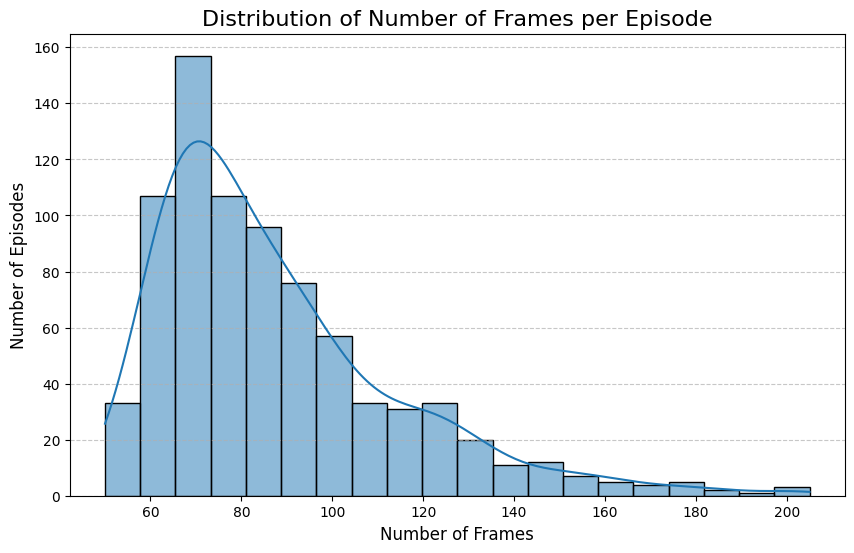


--- Histogram Generated ---
Minimum frames per episode: 50
Maximum frames per episode: 205
Average frames per episode: 87.66
Median frames per episode: 80.0


In [ ]:
# --- Calculate frames per episode ---
# Group by 'episode_index' and count the number of rows (frames) in each group
frames_per_episode = df_partial.groupby('episode_index').size().reset_index(name='num_frames')

print("\n--- Frames per Episode (Head) ---")
print(frames_per_episode.head())

# --- Plotting the histogram ---
plt.figure(figsize=(10, 6))
sns.histplot(frames_per_episode['num_frames'], bins=20, kde=True) # kde=True adds a density curve
plt.title('Distribution of Number of Frames per Episode', fontsize=16)
plt.xlabel('Number of Frames', fontsize=12)
plt.ylabel('Number of Episodes', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

print("\n--- Histogram Generated ---")
print(f"Minimum frames per episode: {frames_per_episode['num_frames'].min()}")
print(f"Maximum frames per episode: {frames_per_episode['num_frames'].max()}")
print(f"Average frames per episode: {frames_per_episode['num_frames'].mean():.2f}")
print(f"Median frames per episode: {frames_per_episode['num_frames'].median()}")

In [ ]:
df_partial.shape

(70131, 7)

In [ ]:
YY = df_partial.groupby('episode_index')['timestamp'].max().reset_index()

YY['timestamp'].describe()

,timestamp
count,800.000000
mean,2.888792
std,0.890599
min,1.633333
25%,2.233333
50%,2.633333
75%,3.266667
max,6.800000


# Preproccessing

In [ ]:
# keep only first n frames of each episode
frames_to_keep = 30
df_partial = df_partial.groupby('episode_index').head(frames_to_keep).reset_index(drop=True)

In [ ]:
df_partial['frame_index'] = df_partial['frame_index'].astype(int)
df_partial['episode_index'] = df_partial['episode_index'].astype(int)

Convert the action column to features columns

In [ ]:
# Function to convert string representation to array
def convert_to_array(text):
    if isinstance(text, (list, np.ndarray)):
        return text

    # Remove brackets and split by spaces or commas
    if isinstance(text, str):
        # Clean the string and extract numbers
        text = text.strip('[]')
        # Split by spaces or commas, handling multiple spaces
        values = re.split(r'[\s,]+', text.strip())
        # Convert to float, filtering out empty strings
        values = [float(val) for val in values if val]
        return values

    return text

# Apply conversion to action column
df_partial['action_array'] = df_partial['action'].apply(convert_to_array)

# Check if conversion worked
print("First converted action:", df_partial['action_array'].iloc[0])
print("Type:", type(df_partial['action_array'].iloc[0]))

# Get number of coordinates from first valid row
sample_idx = 0
while sample_idx < len(df_partial) and not isinstance(df_partial['action_array'].iloc[sample_idx], (list, np.ndarray)):
    sample_idx += 1

if sample_idx < len(df_partial):
    num_action_coords = len(df_partial['action_array'].iloc[sample_idx])
    print(f"Number of coordinates: {num_action_coords}")

    # Create new columns for each action coordinate
    for i in range(num_action_coords):
        col_name = f'joint_delta_pos_{i}'
        df_partial[col_name] = df_partial['action_array'].apply(lambda x: x[i] if isinstance(x, (list, np.ndarray)) and i < len(x) else None)

# df_partial.head()

First converted action: [0.05824046, 0.10764965, -0.10220728, -0.06742571, 0.2495161, -0.13372773, 0.11292724, 0.0]
Type: <class 'list'>
Number of coordinates: 8


In [ ]:
# Get all columns that start with 'joint_delta_pos'
delta_pos_columns = [col for col in df_partial.columns if col.startswith('joint_delta_pos')]

# Calculate the norm (square root of sum of squares)
df_partial['joint_delta_pos_norm'] = np.sqrt(
    np.sum(df_partial[delta_pos_columns] ** 2, axis=1)
)

Convert the observation column to features columns

In [ ]:
# Apply the same conversion to observation.state column
df_partial['observation_state_array'] = df_partial['observation.state'].apply(convert_to_array)

# Check if conversion worked
print("First converted observation state:", df_partial['observation_state_array'].iloc[0])
print("Type:", type(df_partial['observation_state_array'].iloc[0]))

# List of column names for observation.state
observation_state_names = [
    "box0_pos_x", "box0_pos_y", "box0_pos_z",
    "box0_pos_rel_eef_x", "box0_pos_rel_eef_y", "box0_pos_rel_eef_z",
    "box0_quat_x", "box0_quat_y", "box0_quat_z", "box0_quat_w",
    "box0_quat_rel_eef_x", "box0_quat_rel_eef_y", "box0_quat_rel_eef_z", "box0_quat_rel_eef_w",
    "box1_pos_x", "box1_pos_y", "box1_pos_z",
    "box1_pos_rel_eef_x", "box1_pos_rel_eef_y", "box1_pos_rel_eef_z",
    "box1_quat_x", "box1_quat_y", "box1_quat_z", "box1_quat_w",
    "box1_quat_rel_eef_x", "box1_quat_rel_eef_y", "box1_quat_rel_eef_z", "box1_quat_rel_eef_w",
    "box2_pos_x", "box2_pos_y", "box2_pos_z",
    "box2_pos_rel_eef_x", "box2_pos_rel_eef_y", "box2_pos_rel_eef_z",
    "box2_quat_x", "box2_quat_y", "box2_quat_z", "box2_quat_w",
    "box2_quat_rel_eef_x", "box2_quat_rel_eef_y", "box2_quat_rel_eef_z", "box2_quat_rel_eef_w",
    "box3_pos_x", "box3_pos_y", "box3_pos_z",
    "box3_pos_rel_eef_x", "box3_pos_rel_eef_y", "box3_pos_rel_eef_z",
    "box3_quat_x", "box3_quat_y", "box3_quat_z", "box3_quat_w",
    "box3_quat_rel_eef_x", "box3_quat_rel_eef_y", "box3_quat_rel_eef_z", "box3_quat_rel_eef_w",
    "eef_pos_x", "eef_pos_y", "eef_pos_z",
    "eef_quat_x", "eef_quat_y", "eef_quat_z", "eef_quat_w",
    "panda_finger_joint1_pos", "panda_finger_joint2_pos",
    "panda_finger_joint1_vel", "panda_finger_joint2_vel",
    "panda_joint1_pos", "panda_joint2_pos", "panda_joint3_pos",
    "panda_joint4_pos", "panda_joint5_pos", "panda_joint6_pos", "panda_joint7_pos",
    "panda_joint1_vel", "panda_joint2_vel", "panda_joint3_vel",
    "panda_joint4_vel", "panda_joint5_vel", "panda_joint6_vel", "panda_joint7_vel"
]

# Get sample row to check length
sample_idx = 0
while sample_idx < len(df_partial) and not isinstance(df_partial['observation_state_array'].iloc[sample_idx], (list, np.ndarray)):
    sample_idx += 1

if sample_idx < len(df_partial):
    array_length = len(df_partial['observation_state_array'].iloc[sample_idx])
    print(f"Length of observation state array: {array_length}")
    print(f"Length of observation state names: {len(observation_state_names)}")

    # Verify if names match array length
    if array_length != len(observation_state_names):
        print("Warning: Array length doesn't match the number of provided names!")
        # Use the minimum to avoid errors
        num_columns = min(array_length, len(observation_state_names))
    else:
        num_columns = array_length

    # Create columns with the specified names
    for i in range(num_columns):
        col_name = observation_state_names[i] if i < len(observation_state_names) else f"obs_state_{i}"
        df_partial[col_name] = df_partial['observation_state_array'].apply(
            lambda x: x[i] if isinstance(x, (list, np.ndarray)) and i < len(x) else None
        )

    # Show first few rows with some of the new columns
    display_cols = ['timestamp', 'episode_index'] + observation_state_names[:81]  # Show first 5 state columns
    # print(df_partial[display_cols].head())
else:
    print("No valid observation state array found in the first rows")

First converted observation state: [0.22115414, 0.047975525, -0.0050000045, -0.42238638, -0.031988271, 0.21878289, -2.7127811e-09, 8.8324441e-09, 0.75020188, 0.66120887, -0.60783422, 0.70875555, -0.24787873, 0.25837812, 0.53932965, -0.2802574, -0.0050000027, -0.174454, 0.29192337, 0.42514011, -7.8505513e-09, -1.4405627e-08, 0.12233938, 0.99248832, -0.9250561, 0.12676008, -0.35689756, 0.028761482, 0.37704292, -0.0086338427, -0.0050000045, -0.30449894, 0.022584807, 0.32188603, -8.8804555e-09, 2.9459548e-09, -0.44014212, 0.89792812, 0.84388137, 0.39957613, 0.31456691, 0.17102855, 0.30040249, -0.13139957, 0.068785444, -0.30801558, 0.14348483, 0.21344118, -7.9745277e-09, 1.6978841e-08, 0.51313132, 0.8583101, -0.79484677, 0.48991373, -0.314805, 0.17058997, 0.3886624, -0.0027207164, 0.43847525, -0.93361509, 0.012637108, -0.35773537, 0.015117189, 0.03427003, 0.034270015, 0.16046029, 0.16046031, 0.024235627, -0.54736656, -0.021486245, -2.824177, 0.052432917, 3.0088875, 0.76475483, 0.0032687085,

# Feature Engineering

Create eef feature -> The movement of eef

In [ ]:
print("\n--- Calculating Total End-Effector Path Length ---")
shifts = df_partial.groupby('episode_index')[['eef_pos_x', 'eef_pos_y', 'eef_pos_z']].shift(1)

deltas = df_partial[['eef_pos_x', 'eef_pos_y', 'eef_pos_z']] - shifts

df_partial['eef_displacement'] = np.sqrt((deltas**2).sum(axis=1))

df_partial['eef_displacement'] = df_partial['eef_displacement'].fillna(0.0)

print(df_partial['eef_displacement'].head())


--- Calculating Total End-Effector Path Length ---
0    0.000000
1    0.017437
2    0.017375
3    0.017296
4    0.017201
Name: eef_displacement, dtype: float64


Create velocity eef feature

In [ ]:
# another way to do the same:
df_partial['eef_velocity'] = df_partial['eef_displacement'] / (df_partial['timestamp'].iloc[1] - df_partial['timestamp'].iloc[0])

# Create Episodes Dataset:

In [ ]:
df_partial.groupby('episode_index')['timestamp'].max()

,timestamp
episode_index,
0,0.966667
1,0.966667
2,0.966667
3,0.966667
4,0.966667
...,...
795,0.966667
796,0.966667
797,0.966667


In [ ]:
import numpy as np
import pandas as pd

def create_episode_features(df_partial, YY):
    """
    Create episode-level features from time-series data.

    Parameters:
    -----------
    df_partial : pd.DataFrame
        Time-series data with episode_index
    YY : pd.DataFrame
        Base episode table to merge features into

    Returns:
    --------
    pd.DataFrame
        Episode table with all engineered features
    """

    # Initialize working dataframes
    df = df_partial.copy()
    episode_table = YY.copy()

    print(f"Starting with {len(episode_table)} episodes and {len(df)} time-series records")

    # =============================================================================
    # 1. EEF DISPLACEMENT FEATURES
    # =============================================================================

    def add_displacement_features(df, episode_table):
        """Add end-effector displacement aggregation features"""
        print("Computing displacement features...")

        # Sum of displacement by episode
        displacement_sum = (df.groupby('episode_index')['eef_displacement']
                          .sum()
                          .reset_index()
                          .rename(columns={"eef_displacement": "displacement_sum"}))

        episode_table = episode_table.merge(displacement_sum, on='episode_index', how='left')

        # Norm of displacement (L2 norm by episode)
        df_temp = df.copy()
        df_temp['eef_displacement_squared'] = df_temp['eef_displacement'] ** 2

        displacement_norm = (df_temp.groupby('episode_index')['eef_displacement_squared']
                           .sum()
                           .reset_index())
        displacement_norm['norm_eef_displacement'] = np.sqrt(displacement_norm['eef_displacement_squared'])
        displacement_norm = displacement_norm[['episode_index', 'norm_eef_displacement']]

        episode_table = episode_table.merge(displacement_norm, on='episode_index', how='left')

        # Comprehensive displacement statistics
        displacement_stats = (df.groupby('episode_index')['eef_displacement']
                            .agg(['mean', 'max', 'sum', 'var', 'std'])
                            .reset_index())

        displacement_stats.columns = ['episode_index', 'mean_eef_displacement', 'max_eef_displacement',
                                    'sum_eef_displacement', 'var_eef_displacement', 'std_eef_displacement']

        episode_table = episode_table.merge(displacement_stats, on='episode_index', how='left')

        return episode_table

    episode_table = add_displacement_features(df, episode_table)

    # =============================================================================
    # 2. EEF VELOCITY FEATURES
    # =============================================================================

    def add_velocity_features(df, episode_table):
        """Add end-effector velocity aggregation features"""
        print("Computing velocity features...")

        velocity_stats = (df.groupby('episode_index')['eef_velocity']
                        .agg(['mean', 'max', 'sum', 'var', 'std'])
                        .reset_index())

        velocity_stats.columns = ['episode_index', 'mean_eef_velocity', 'max_eef_velocity',
                                'sum_eef_velocity', 'var_eef_velocity', 'std_eef_velocity']

        episode_table = episode_table.merge(velocity_stats, on='episode_index', how='left')

        return episode_table

    episode_table = add_velocity_features(df, episode_table)

    # =============================================================================
    # 3. JOINT POSITION DELTA NORMS (Individual joints)
    # =============================================================================

    def add_individual_joint_norms(df, episode_table):
        """Add L2 norm for each joint delta position by episode"""
        print("Computing individual joint delta position norms...")

        df_temp = df.copy()
        joint_norms_list = []

        for joint_idx in range(1, 8):
            col_name = f'joint_delta_pos_{joint_idx}'

            # Square the values
            df_temp[f'{col_name}_squared'] = df_temp[col_name] ** 2

            # Sum squares by episode and take square root
            joint_norm = (df_temp.groupby('episode_index')[f'{col_name}_squared']
                         .sum()
                         .reset_index())
            joint_norm[f'norm_joint_delta_pos{joint_idx}'] = np.sqrt(joint_norm[f'{col_name}_squared'])
            joint_norm = joint_norm[['episode_index', f'norm_joint_delta_pos{joint_idx}']]

            joint_norms_list.append(joint_norm)

        # Merge all joint norms sequentially
        for joint_norm in joint_norms_list:
            episode_table = episode_table.merge(joint_norm, on='episode_index', how='left')

        return episode_table

    episode_table = add_individual_joint_norms(df, episode_table)

    # =============================================================================
    # 4. TOTAL JOINT POSITION DELTA NORM (Sum of per-timestep norms)
    # =============================================================================

    def add_total_joint_norm(df_partial, episode_table):
        """Add total joint delta position norm (sum of per-timestep L2 norms)"""
        print("Computing total joint delta position norm...")

        df_work = df_partial.copy()

        # Get all joint delta position columns
        delta_pos_columns = [col for col in df_work.columns if col.startswith('joint_delta_pos')]

        # Calculate per-timestep L2 norm across all joints
        df_work['joint_delta_pos_norm'] = np.sqrt(
            np.sum(df_work[delta_pos_columns] ** 2, axis=1)
        )

        # Sum these norms by episode
        episode_norm = (df_work.groupby('episode_index')['joint_delta_pos_norm']
                       .sum()
                       .reset_index()
                       .rename(columns={'joint_delta_pos_norm': 'norm_joint_delta_pos_total'}))

        episode_table = episode_table.merge(episode_norm, on='episode_index', how='left')

        return episode_table

    episode_table = add_total_joint_norm(df_partial, episode_table)

    # =============================================================================
    # 5. JOINT 7 SWITCH DETECTION
    # =============================================================================

    def add_joint7_switches(df, episode_table):
        """Count switches in joint_delta_pos_7 within each episode"""
        print("Computing joint 7 switch counts...")

        df_temp = df.copy()

        # Detect value changes
        df_temp['joint_delta_pos_7_switch'] = df_temp['joint_delta_pos_7'].ne(df_temp['joint_delta_pos_7'].shift())

        # Only count switches within the same episode (not across episode boundaries)
        df_temp['switch_flag'] = (df_temp['joint_delta_pos_7_switch'] &
                                 (df_temp['episode_index'] == df_temp['episode_index'].shift()))

        # Count switches per episode
        switch_counts = (df_temp.groupby('episode_index')['switch_flag']
                        .sum()
                        .reset_index()
                        .rename(columns={'switch_flag': 'joint_delta_pos_7_switches'}))

        episode_table = episode_table.merge(switch_counts, on='episode_index', how='left')

        return episode_table

    episode_table = add_joint7_switches(df, episode_table)

    # =============================================================================
    # 6. BOX-EEF SPATIAL FEATURES
    # =============================================================================

    def add_box_eef_features(df_partial, episode_table):
        """Add box-to-end-effector distance and quaternion angle features"""
        print("Computing box-EEF spatial features...")

        df_work = df_partial.copy()

        # Euclidean distances from each box to end-effector
        for box_idx in range(4):
            df_work[f"box{box_idx}_eef_dist"] = np.sqrt(
                df_work[f"box{box_idx}_pos_rel_eef_x"]**2 +
                df_work[f"box{box_idx}_pos_rel_eef_y"]**2 +
                df_work[f"box{box_idx}_pos_rel_eef_z"]**2
            )

        # Quaternion angle differences
        def quat_angle_diff(q1, q2):
            """Returns angular difference between two unit quaternions"""
            dot = np.clip(np.sum(q1 * q2, axis=1), -1.0, 1.0)
            return 2 * np.arccos(np.abs(dot))

        # Box-to-EEF quaternion angles
        for box_idx in range(4):
            q_box = df_work[[f"box{box_idx}_quat_x", f"box{box_idx}_quat_y",
                           f"box{box_idx}_quat_z", f"box{box_idx}_quat_w"]].values
            q_eef = df_work[["eef_quat_x", "eef_quat_y", "eef_quat_z", "eef_quat_w"]].values
            df_work[f"box{box_idx}_eef_quat_angle"] = quat_angle_diff(q_box, q_eef)

        # Box-to-Box quaternion dot products
        for i in range(4):
            for j in range(i + 1, 4):
                box_i_quat = df_work[[f"box{i}_quat_x", f"box{i}_quat_y",
                                    f"box{i}_quat_z", f"box{i}_quat_w"]].values
                box_j_quat = df_work[[f"box{j}_quat_x", f"box{j}_quat_y",
                                    f"box{j}_quat_z", f"box{j}_quat_w"]].values
                df_work[f"box{i}_box{j}_quat_dot"] = np.sum(box_i_quat * box_j_quat, axis=1)

        # Box-to-Box Euclidean distances
        for i in range(4):
            for j in range(i + 1, 4):
                # Calculate Euclidean distance between box i and box j positions
                df_work[f"box{i}_box{j}_dist"] = np.sqrt(
                    (df_work[f"box{i}_pos_x"] - df_work[f"box{j}_pos_x"])**2 +
                    (df_work[f"box{i}_pos_y"] - df_work[f"box{j}_pos_y"])**2 +
                    (df_work[f"box{i}_pos_z"] - df_work[f"box{j}_pos_z"])**2
                )

        return df_work, episode_table

    df_with_spatial, episode_table = add_box_eef_features(df_partial, episode_table)

    # =============================================================================
    # 7. AGGREGATE SPATIAL FEATURES BY EPISODE
    # =============================================================================

    def add_spatial_aggregates(df_with_spatial, episode_table):
        """Aggregate spatial features (distances, angles, dots) by episode"""
        print("Aggregating spatial features by episode...")

        # Select spatial feature columns
        spatial_features = [col for col in df_with_spatial.columns if (
            ("box" in col and "dist" in col) or
            ("quat_angle" in col) or
            ("quat_dot" in col)
        )]

        print(f"Found {len(spatial_features)} spatial features to aggregate")

        # Aggregate with mean, min, max
        spatial_agg = (df_with_spatial.groupby("episode_index")[spatial_features]
                      .agg(['mean', 'min', 'max']))

        # Flatten MultiIndex columns
        spatial_agg.columns = [f"{col}_{stat}" for col, stat in spatial_agg.columns]
        spatial_agg = spatial_agg.reset_index()

        # Merge with episode table
        episode_table = episode_table.merge(spatial_agg, on="episode_index", how="left")

        return episode_table

    episode_table = add_spatial_aggregates(df_with_spatial, episode_table)

    # =============================================================================
    # 8. HANDLE TIMESTAMP COLUMN RENAME
    # =============================================================================

    if "timestamp" in episode_table.columns:
        episode_table.rename(columns={"timestamp": "max_of_timestamp"}, inplace=True)
        print("Renamed 'timestamp' column to 'max_of_timestamp'")

    # =============================================================================
    # 9. FINAL VALIDATION AND SUMMARY
    # =============================================================================

    print(f"\nFeature engineering complete!")
    print(f"Final episode table shape: {episode_table.shape}")
    print(f"Total features created: {len(episode_table.columns) - len(YY.columns)}")

    # Check for any missing values in key features
    key_features = ['displacement_sum', 'norm_eef_displacement', 'norm_joint_delta_pos_total']
    for feature in key_features:
        if feature in episode_table.columns:
            missing_count = episode_table[feature].isna().sum()
            if missing_count > 0:
                print(f"WARNING: {missing_count} missing values in {feature}")

    return episode_table

# =============================================================================
# MAIN EXECUTION
# =============================================================================

# Usage:
episode_table = create_episode_features(df_partial, YY)

Starting with 800 episodes and 24000 time-series records
Computing displacement features...
Computing velocity features...
Computing individual joint delta position norms...
Computing total joint delta position norm...
Computing joint 7 switch counts...
Computing box-EEF spatial features...
Aggregating spatial features by episode...
Found 20 spatial features to aggregate
Renamed 'timestamp' column to 'max_of_timestamp'

Feature engineering complete!
Final episode table shape: (800, 83)
Total features created: 81


In [ ]:
# Redefine the extended feature engineering pipeline after reset
def add_joint_total_angular_displacement(df_partial, episode_table):
    """Add total angular displacement per joint across time within each episode."""
    print("\n--- Calculating Total Angular Displacement Per Joint ---")

    df_sorted = df_partial.sort_values(by=['episode_index', 'timestamp'])

    joint_pos_cols = [f'panda_joint{i}_pos' for i in range(1, 8)]
    joint_displacements = df_sorted.groupby('episode_index')[joint_pos_cols].apply(lambda group: group.diff().abs().sum()).reset_index()
    joint_displacements.rename(columns={f'panda_joint{i}_pos': f'joint{i}_total_displacement' for i in range(1, 8)}, inplace=True)

    return episode_table.merge(joint_displacements, on='episode_index', how='left')



def add_gripper_action_changes(df_partial, episode_table):
    """Count number of gripper action changes based on joint_delta_pos_7."""
    print("\n--- Calculating Gripper Action Change Count ---")

    df_sorted = df_partial.sort_values(by=['episode_index', 'timestamp'])
    gripper_changes = df_sorted.groupby('episode_index').apply(
        lambda group: (group['joint_delta_pos_7'].diff().iloc[1:] != 0).sum()
    ).reset_index(name='gripper_action_changes_count')

    return episode_table.merge(gripper_changes, on='episode_index', how='left')



episode_table = add_joint_total_angular_displacement(df_partial, episode_table)
episode_table = add_gripper_action_changes(df_partial, episode_table)


--- Calculating Total Angular Displacement Per Joint ---

--- Calculating Gripper Action Change Count ---


/tmp/ipython-input-17-1142735460.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  gripper_changes = df_sorted.groupby('episode_index').apply(


In [ ]:
episode_table.shape

(800, 91)

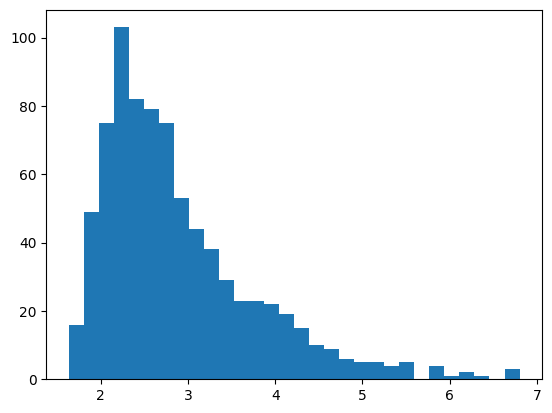

(array([ 6.,  5., 22., 32., 45., 52., 63., 55., 65., 46., 46., 51., 44.,
        44., 30., 30., 24., 25., 17., 28., 17., 13.,  7.,  8.,  8.,  6.,
         2.,  4.,  2.,  3.]),
 array([0.4906229 , 0.53816622, 0.58570954, 0.63325287, 0.68079619,
        0.72833952, 0.77588284, 0.82342616, 0.87096949, 0.91851281,
        0.96605613, 1.01359946, 1.06114278, 1.10868611, 1.15622943,
        1.20377275, 1.25131608, 1.2988594 , 1.34640273, 1.39394605,
        1.44148937, 1.4890327 , 1.53657602, 1.58411935, 1.63166267,
        1.67920599, 1.72674932, 1.77429264, 1.82183596, 1.86937929,
        1.91692261]),
 <BarContainer object of 30 artists>)

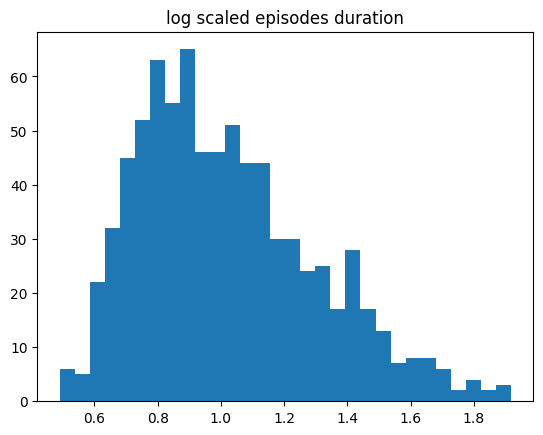

In [ ]:
plt.hist(episode_table["max_of_timestamp"],bins = 30)
plt.show()
plt.title('log scaled episodes duration')
plt.hist(np.log(episode_table["max_of_timestamp"]),bins = 30)

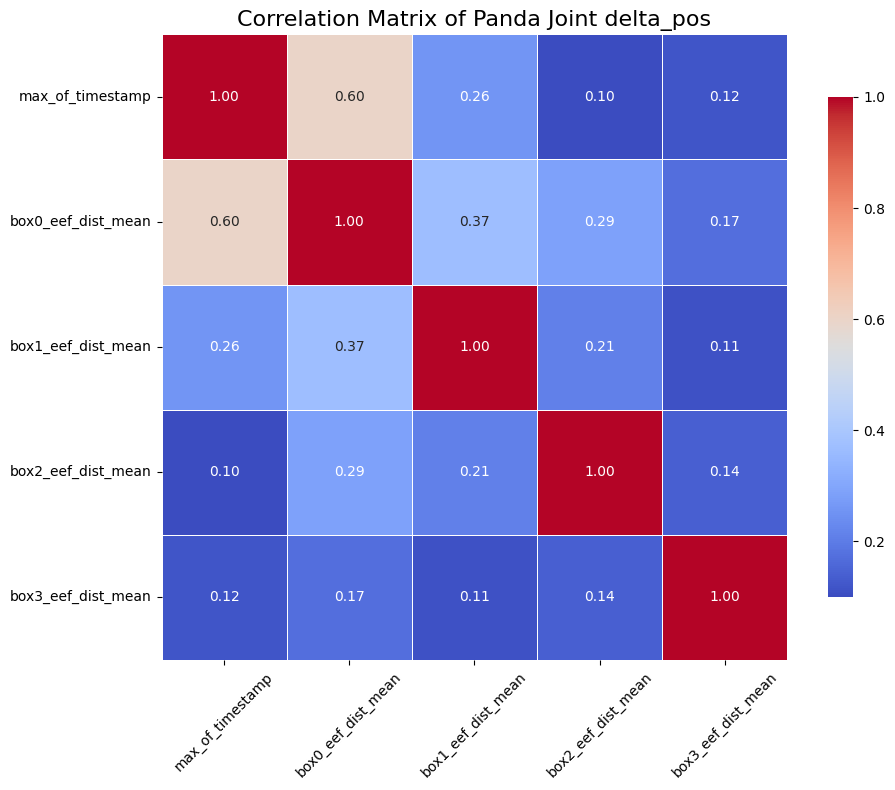

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box{i}_eef_dist_mean' for i in range(0, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

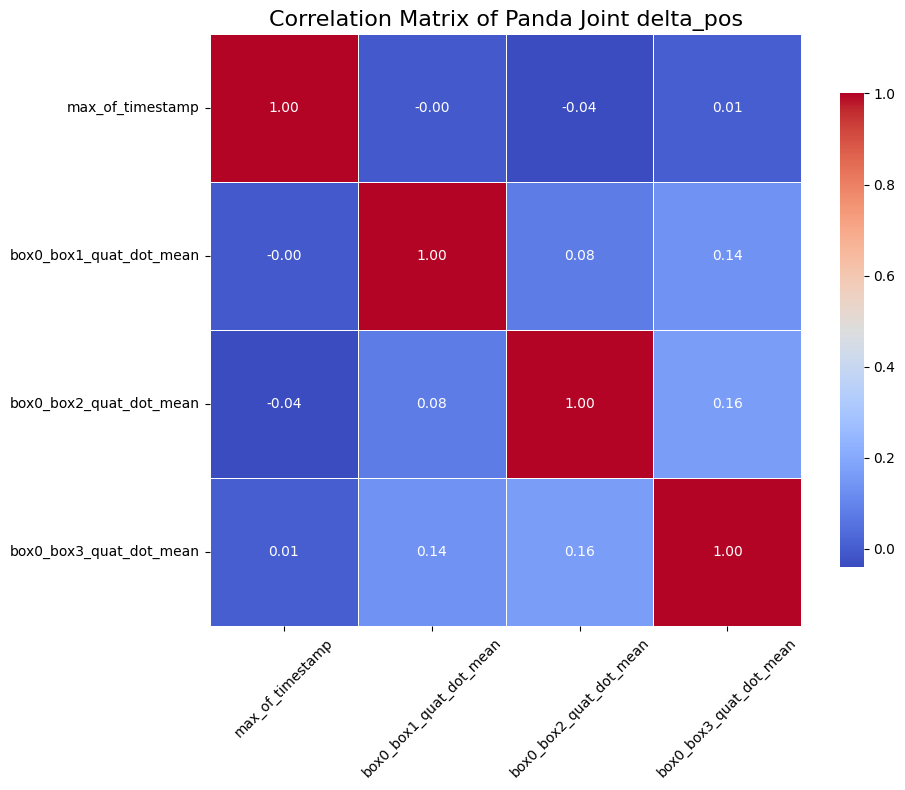

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box0_box{i}_quat_dot_mean' for i in range(1, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

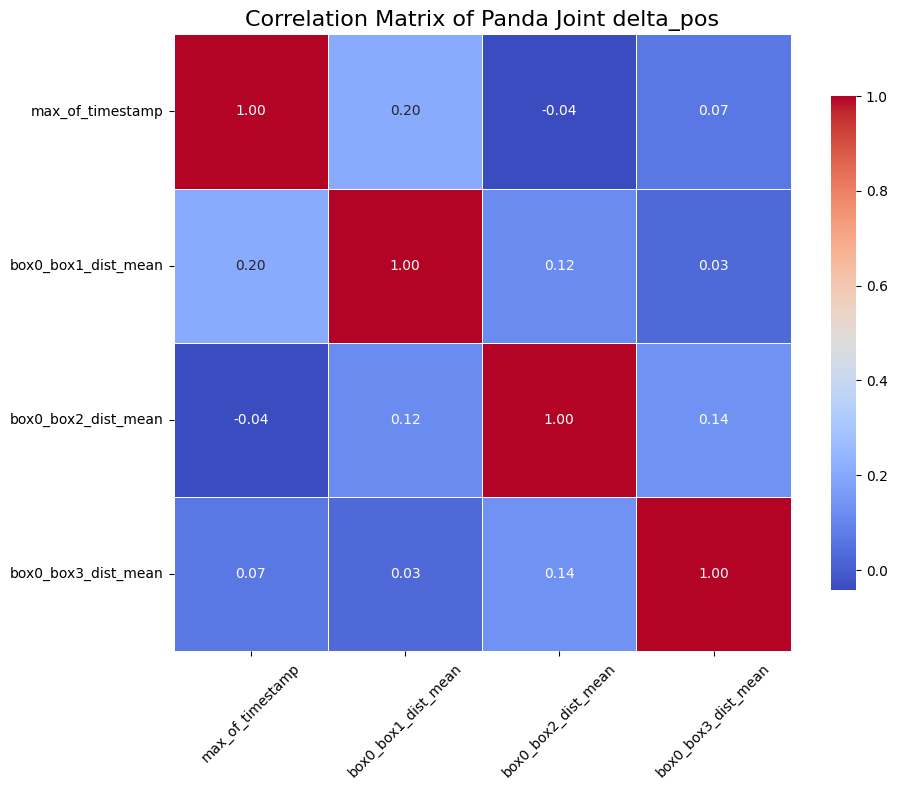

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

# Select only the delta_pos columns
delta_pos_cols = ['max_of_timestamp'] + [f'box0_box{i}_dist_mean' for i in range(1, 4)]
delta_pos_data = episode_table[delta_pos_cols]

# Compute the correlation matrix
corr_matrix = delta_pos_data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,      # Show correlation values
    fmt=".2f",       # Format numbers to 2 decimal places
    cmap='coolwarm', # Color map
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title('Correlation Matrix of Panda Joint delta_pos', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
corr_threshold = 0.9
# Drop correlated features
feature_cols = [col for col in episode_table.columns if col != "episode_index"]
corr_matrix = episode_table[feature_cols].corr().abs()

# Select upper triangle of correlation matrix
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than threshold
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > corr_threshold)]

# Drop from episode table
episode_table = episode_table.drop(columns=to_drop)

print(f"Removed {len(to_drop)} highly correlated features:")
print(sorted(to_drop))

Removed 41 highly correlated features:
['box0_box1_dist_max', 'box0_box1_dist_min', 'box0_box1_quat_dot_max', 'box0_box1_quat_dot_min', 'box0_box2_dist_max', 'box0_box2_dist_min', 'box0_box2_quat_dot_max', 'box0_box2_quat_dot_min', 'box0_box3_dist_max', 'box0_box3_quat_dot_max', 'box0_box3_quat_dot_min', 'box0_eef_dist_min', 'box1_box2_dist_max', 'box1_box2_dist_min', 'box1_box2_quat_dot_max', 'box1_box2_quat_dot_min', 'box1_box3_dist_max', 'box1_box3_quat_dot_max', 'box1_box3_quat_dot_min', 'box1_eef_dist_min', 'box2_box3_dist_max', 'box2_box3_quat_dot_max', 'box2_box3_quat_dot_min', 'box2_eef_dist_min', 'gripper_action_changes_count', 'joint2_total_displacement', 'joint3_total_displacement', 'joint4_total_displacement', 'joint5_total_displacement', 'joint6_total_displacement', 'joint7_total_displacement', 'max_eef_displacement', 'max_eef_velocity', 'mean_eef_displacement', 'mean_eef_velocity', 'norm_eef_displacement', 'std_eef_displacement', 'std_eef_velocity', 'sum_eef_displacement'

In [ ]:
def find_highly_correlated_features(df, threshold=0.9):
    """
    Identify pairs of features with correlation above a given threshold.

    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame containing only numerical features.
    threshold : float
        Minimum absolute correlation to be considered high.

    Returns:
    --------
    List of tuples: [(feature1, feature2, correlation), ...]
    """
    # Compute correlation matrix
    corr_matrix = df.corr().abs()

    # Create boolean mask for upper triangle
    upper = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

    # Apply mask
    upper_corr = corr_matrix.where(upper)

    # Extract highly correlated pairs
    high_corr = [
        (col1, col2, upper_corr.loc[col1, col2])
        for col1 in upper_corr.columns
        for col2 in upper_corr.columns
        if col1 != col2 and upper_corr.loc[col1, col2] > threshold
    ]

    # Sort by correlation value
    return sorted(high_corr, key=lambda x: -x[2])

# Example usage:
# Assume X is your features dataframe (exclude target column)
high_corr_features = find_highly_correlated_features(episode_table, threshold=0.9)
for f1, f2, corr in high_corr_features:
    print(f"{f1} and {f2} have correlation {corr:.3f}")


In [ ]:
episode_table['box0_eef_dist_mean'].describe()

,box0_eef_dist_mean
count,800.000000
mean,0.367882
std,0.082410
min,0.209111
25%,0.317342
50%,0.355443
75%,0.403128
max,0.757270


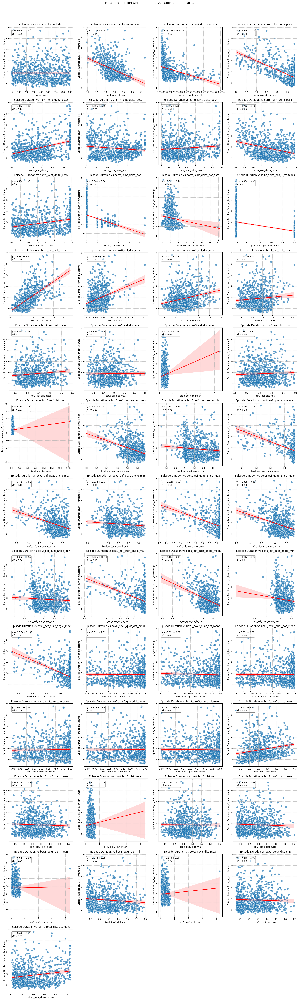

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress

# Define the target variable (episode duration)
target_col = 'max_of_timestamp'

# Get all numeric feature columns except the target
feature_cols = [col for col in episode_table.columns if col != target_col and episode_table[col].dtype in ['float64', 'int64']]

# Set up the figure with subplots
num_features = len(feature_cols)
num_rows = (num_features // 4) + (1 if num_features % 4 != 0 else 0)  # Determine rows dynamically
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
axes = axes.flatten()  # Flatten axes for easy indexing

# Create scatter plot for each feature vs episode duration
for i, feature_col in enumerate(feature_cols):
    x = episode_table[feature_col]
    y = episode_table[target_col]

    # Calculate regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    equation = f"y = {slope:.2f}x + {intercept:.2f}"
    r_squared = f"$R^2$ = {r_value**2:.2f}"

    # Plot on the appropriate subplot
    ax = axes[i]
    sns.scatterplot(x=x, y=y, s=80, alpha=0.7, ax=ax)
    sns.regplot(x=x, y=y, scatter=False, color='red', ax=ax)

    # Add title and labels
    ax.set_title(f'Episode Duration vs {feature_col}', fontsize=12)
    ax.set_ylabel('Episode Duration (sum_of_timestamp)', fontsize=10)
    ax.set_xlabel(f'{feature_col}', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    # Add annotation with equation and R^2
    ax.text(0.05, 0.95, f"{equation}\n{r_squared}",
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.5))

# Remove unused subplots if there are extra
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout and add main title
plt.tight_layout()
fig.suptitle('Relationship Between Episode Duration and Features', fontsize=16, y=1.02)

plt.show()


In [ ]:
episode_table.describe()

,episode_index,max_of_timestamp,displacement_sum,var_eef_displacement,norm_joint_delta_pos1,norm_joint_delta_pos2,norm_joint_delta_pos3,norm_joint_delta_pos4,norm_joint_delta_pos5,norm_joint_delta_pos6,...,box0_box1_dist_mean,box0_box2_dist_mean,box0_box3_dist_mean,box0_box3_dist_min,box1_box2_dist_mean,box1_box3_dist_mean,box1_box3_dist_min,box2_box3_dist_mean,box2_box3_dist_min,joint1_total_displacement
count,800.0000,800.000000,800.000000,8.000000e+02,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,...,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,399.5000,2.888792,0.373660,1.860822e-05,0.938466,0.511454,0.524138,0.505665,0.761991,0.644895,...,0.329413,0.337747,0.346971,0.341301,0.275843,0.280481,0.275339,0.268398,0.263264,0.387180
std,231.0844,0.890599,0.086293,2.272876e-05,0.273992,0.324409,0.307309,0.366070,0.332357,0.413049,...,0.135912,0.134972,0.192670,0.131538,0.150325,0.212652,0.156690,0.205974,0.150666,0.280346
min,0.0000,1.633333,0.091966,7.974574e-07,0.003379,0.000594,0.001017,0.001111,0.002793,0.000691,...,0.054691,0.065727,0.060147,0.060060,0.051985,0.056328,0.056328,0.058171,0.058171,0.002281
25%,199.7500,2.233333,0.326319,5.031491e-06,0.861196,0.256935,0.255484,0.216844,0.523880,0.300281,...,0.234071,0.244219,0.249729,0.248678,0.138214,0.128230,0.128230,0.124275,0.124275,0.159247
50%,399.5000,2.633333,0.364217,9.563754e-06,1.065334,0.472025,0.521733,0.431307,0.775425,0.586814,...,0.309572,0.318435,0.327481,0.326260,0.261170,0.268579,0.268203,0.256066,0.255815,0.323415
75%,599.2500,3.266667,0.429697,2.186452e-05,1.120292,0.698683,0.774607,0.713624,1.033393,0.982183,...,0.418957,0.431148,0.431897,0.430542,0.386047,0.382727,0.381015,0.366039,0.364781,0.580343
max,799.0000,6.800000,0.742926,1.378887e-04,1.138880,1.138874,1.138843,1.366678,1.366636,1.366715,...,0.694276,0.716518,4.332782,0.698786,0.705457,4.342128,0.692333,4.236870,0.702689,1.059908


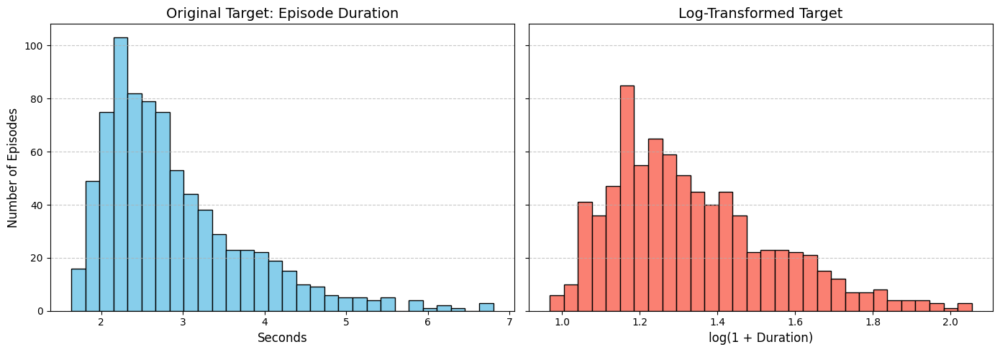

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assume episode_table is already defined and contains "max_of_timestamp"
# Compute logged version (with +1 to handle zero safely)
episode_table['logged_max_of_timestamp'] = np.log1p(episode_table['max_of_timestamp'])

# Plot side-by-side histograms
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# Original target distribution
axes[0].hist(episode_table['max_of_timestamp'], bins=30, color='skyblue', edgecolor='black')
axes[0].set_title("Original Target: Episode Duration", fontsize=14)
axes[0].set_xlabel("Seconds", fontsize=12)
axes[0].set_ylabel("Number of Episodes", fontsize=12)
axes[0].grid(True, axis='y', linestyle='--', alpha=0.7)

# Log-transformed target distribution
axes[1].hist(episode_table['logged_max_of_timestamp'], bins=30, color='salmon', edgecolor='black')
axes[1].set_title("Log-Transformed Target", fontsize=14)
axes[1].set_xlabel("log(1 + Duration)", fontsize=12)
axes[1].grid(True, axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


# Some EDA

## Regression EDA

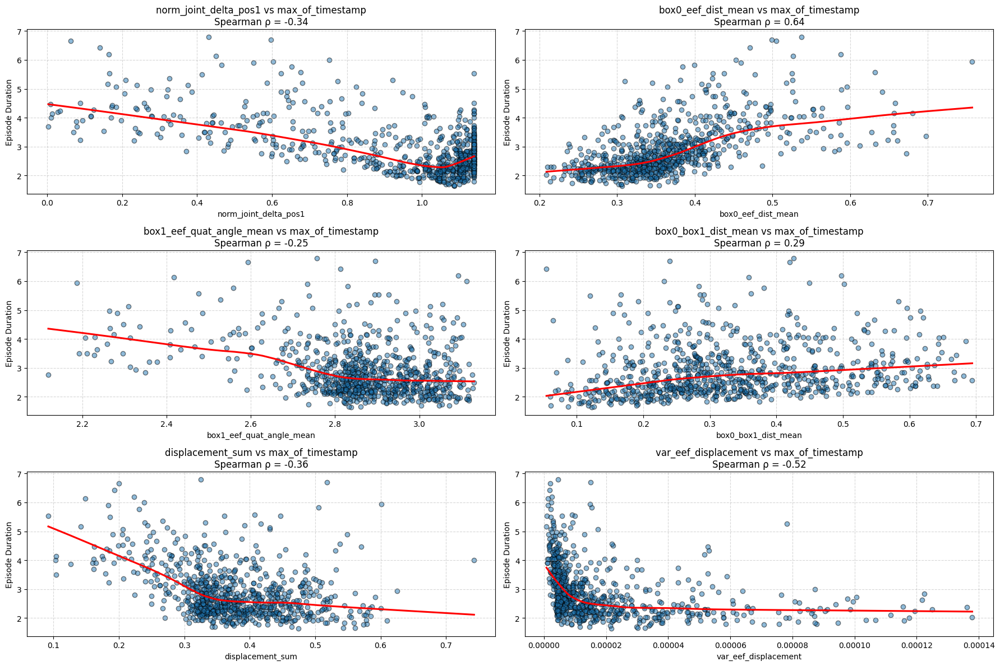

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr

# Load your dataset
df = episode_table

# List of important features
important_features = [
    'norm_joint_delta_pos1',
    'box0_eef_dist_mean',
    'box1_eef_quat_angle_mean',
    'box0_box1_dist_mean',
    'displacement_sum',
    'var_eef_displacement',
]

target_col = 'max_of_timestamp'

# Plot settings
plt.figure(figsize=(18, 12))
for idx, feature in enumerate(important_features, 1):
    plt.subplot(3, 2, idx)

    # Plot with LOWESS smoothing
    sns.regplot(
        x=df[feature],
        y=df[target_col],
        lowess=True,
        scatter_kws={'alpha': 0.5, 'edgecolor': 'k'},
        line_kws={'color': 'red'}
    )

    # Compute Spearman correlation
    rho, _ = spearmanr(df[feature], df[target_col])

    plt.title(f"{feature} vs {target_col}\nSpearman ρ = {rho:.2f}")
    plt.xlabel(feature)
    plt.ylabel("Episode Duration")
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


/tmp/ipython-input-30-1362340760.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='binned_dist', y='max_of_timestamp', palette='pastel')


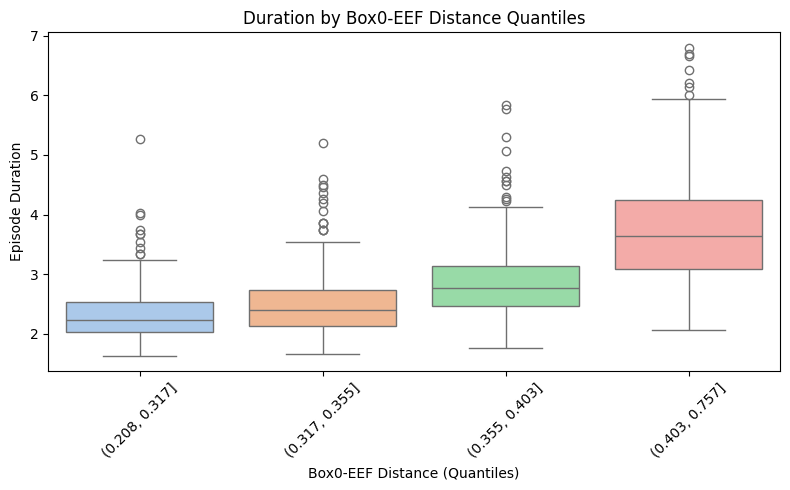

In [ ]:
# Bin spatial feature
df = episode_table
df['binned_dist'] = pd.qcut(df['box0_eef_dist_mean'], q=4, duplicates='drop')

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='binned_dist', y='max_of_timestamp', palette='pastel')
plt.title("Duration by Box0-EEF Distance Quantiles")
plt.xticks(rotation=45)
plt.xlabel("Box0-EEF Distance (Quantiles)")
plt.ylabel("Episode Duration")
plt.tight_layout()
plt.show()


/tmp/ipython-input-31-2212039824.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='binned_displacement', y='max_of_timestamp', palette='pastel')


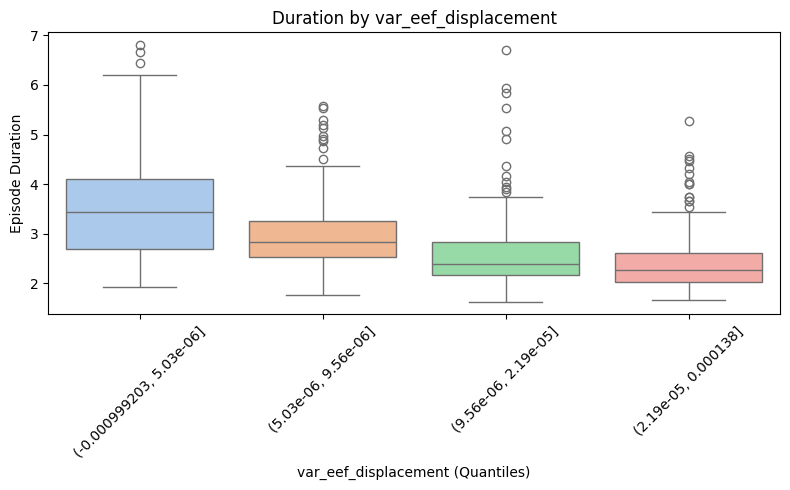

In [ ]:
# Bin spatial feature
df = episode_table
df['binned_displacement'] = pd.qcut(df['var_eef_displacement'], q=4, duplicates='drop')

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='binned_displacement', y='max_of_timestamp', palette='pastel')
plt.title("Duration by var_eef_displacement")
plt.xticks(rotation=45)
plt.xlabel("var_eef_displacement (Quantiles)")
plt.ylabel("Episode Duration")
plt.tight_layout()
plt.show()


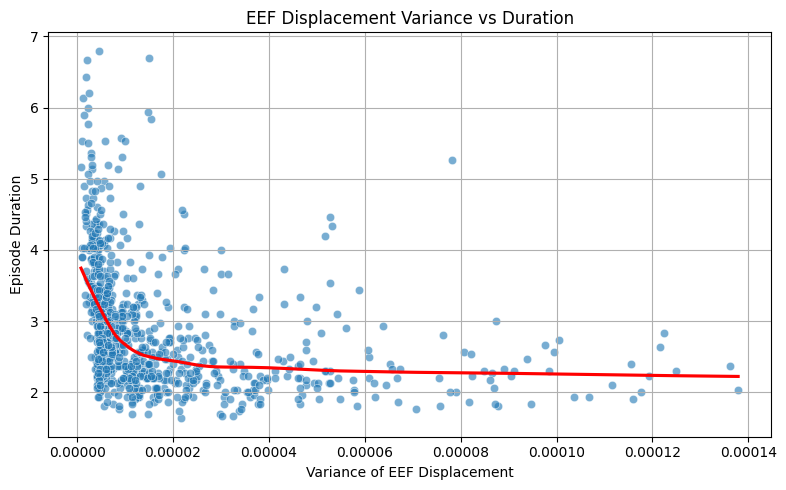

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='var_eef_displacement', y='max_of_timestamp', alpha=0.6)
sns.regplot(data=df, x='var_eef_displacement', y='max_of_timestamp', lowess=True, scatter=False, color='red')
plt.title("EEF Displacement Variance vs Duration")
plt.xlabel("Variance of EEF Displacement")
plt.ylabel("Episode Duration")
plt.grid(True)
plt.tight_layout()
plt.show()


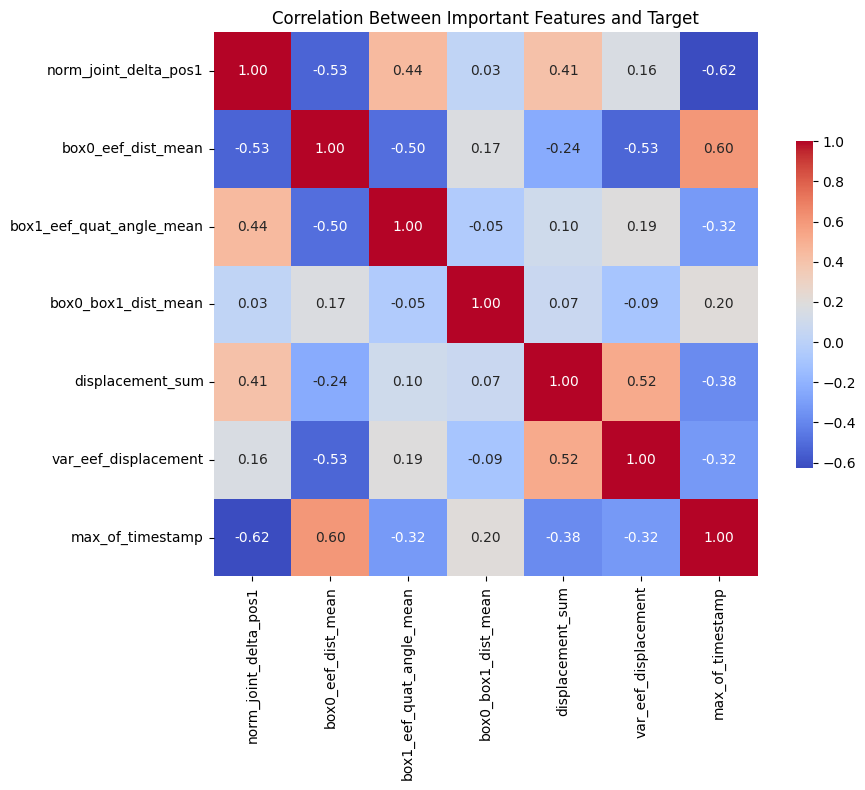

In [ ]:
top_features = important_features + ['max_of_timestamp']
corr = df[top_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={'shrink': .6})
plt.title("Correlation Between Important Features and Target")
plt.tight_layout()
plt.show()


## Classification EDA

In [ ]:
df = episode_table
median_timestamp = df['max_of_timestamp'].median()
df['Class'] = (df['max_of_timestamp'] > median_timestamp).astype(int)

In [ ]:
df[top_features + ['Class', ]].corr()

,norm_joint_delta_pos1,box0_eef_dist_mean,box1_eef_quat_angle_mean,box0_box1_dist_mean,displacement_sum,var_eef_displacement,max_of_timestamp,Class
norm_joint_delta_pos1,1.000000,-0.531460,0.443732,0.028662,0.405796,0.157808,-0.624508,-0.441909
box0_eef_dist_mean,-0.531460,1.000000,-0.497084,0.172123,-0.238379,-0.527116,0.602058,0.536252
box1_eef_quat_angle_mean,0.443732,-0.497084,1.000000,-0.047870,0.101008,0.191738,-0.318795,-0.263634
box0_box1_dist_mean,0.028662,0.172123,-0.047870,1.000000,0.073421,-0.092217,0.204403,0.235667
displacement_sum,0.405796,-0.238379,0.101008,0.073421,1.000000,0.523116,-0.378839,-0.279961
var_eef_displacement,0.157808,-0.527116,0.191738,-0.092217,0.523116,1.000000,-0.320673,-0.324462
max_of_timestamp,-0.624508,0.602058,-0.318795,0.204403,-0.378839,-0.320673,1.000000,0.737469
Class,-0.441909,0.536252,-0.263634,0.235667,-0.279961,-0.324462,0.737469,1.000000


In [ ]:
correlations = df[top_features + ['Class', ]].corr()['Class'].sort_values(ascending=False)

In [ ]:
top_features = correlations[correlations.index != 'Class'].abs().sort_values(ascending=False).head(4).index

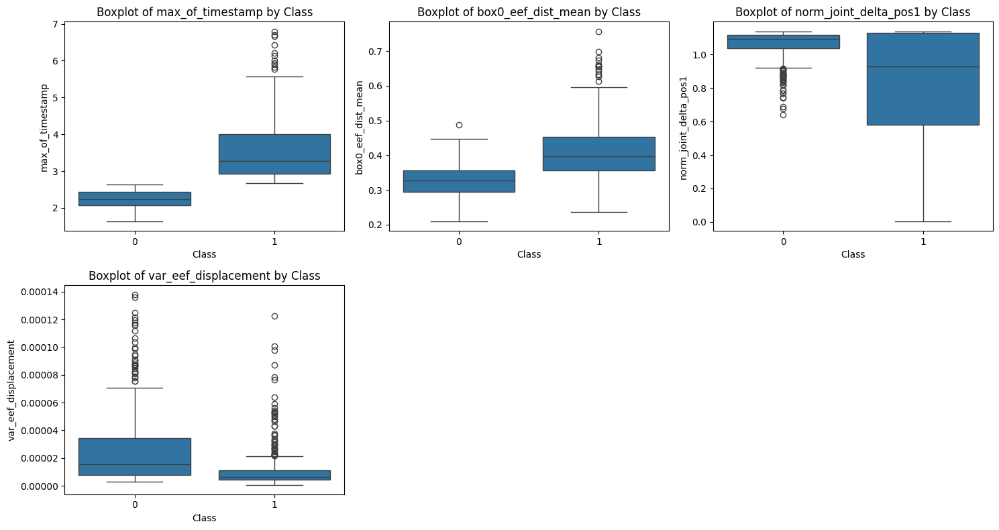

In [ ]:
# Plot configuration
n_features = len(top_features)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each boxplot
for i, feature in enumerate(top_features):
    sns.boxplot(x='Class', y=feature, data=df, ax=axes[i])
    axes[i].set_title(f"Boxplot of {feature} by Class")

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


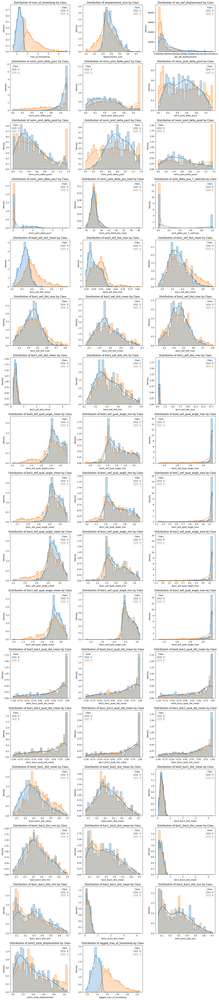

In [ ]:
# Define features to plot (all numeric features excluding ID/target)

features = df.drop(columns=['sum_of_timestamp', 'Class', 'episode_index'], errors='ignore').select_dtypes(include=np.number).columns

# Subplot configuration
n_features = len(features)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # Flatten to 1D array for easy indexing

# Plot each feature
for i, feature in enumerate(features):
    sns.histplot(data=df, x=feature, hue='Class', kde=True, bins=30,
                 element="step", stat="density", ax=axes[i])
    axes[i].set_title(f"Distribution of {feature} by Class")

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

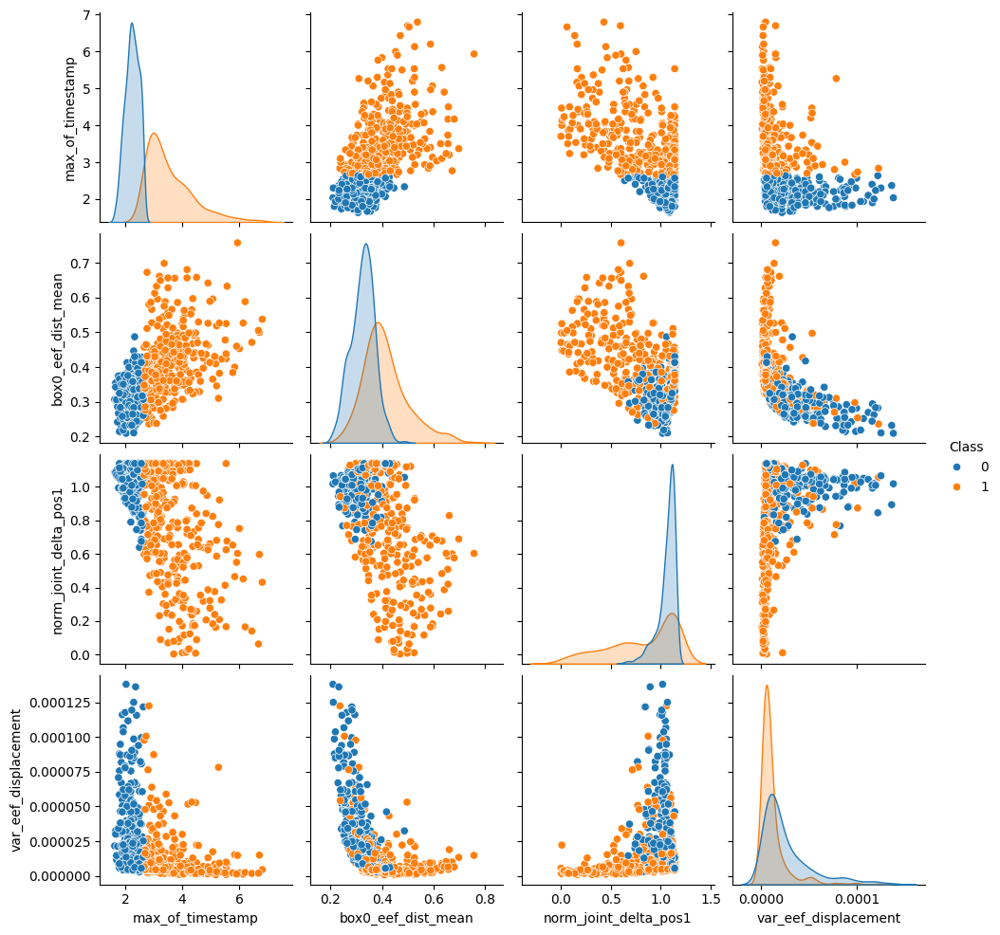

In [ ]:
sns.pairplot(df, vars=top_features, hue='Class')

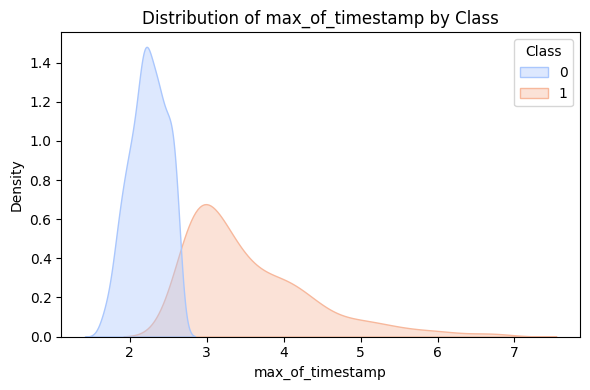

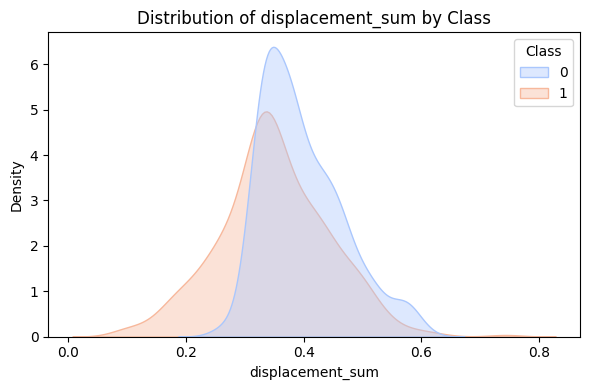

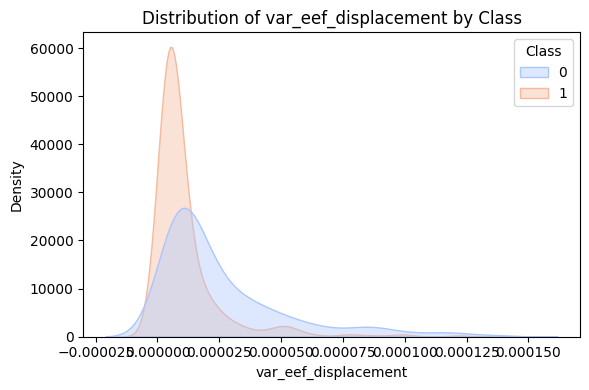

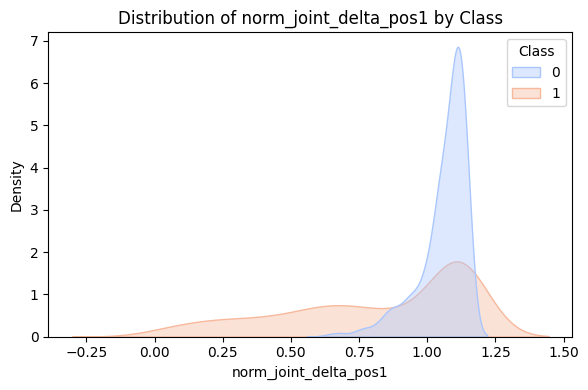

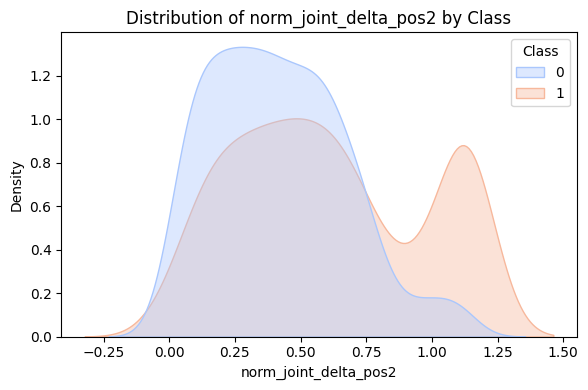

...

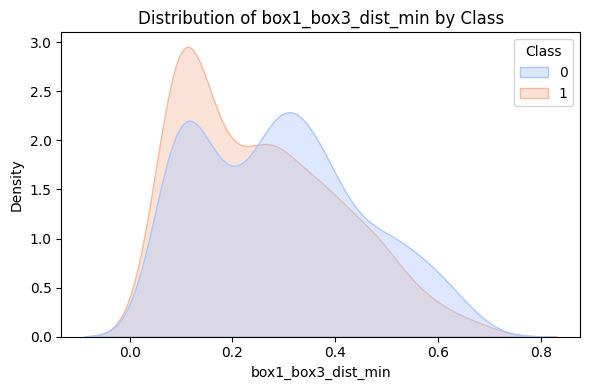

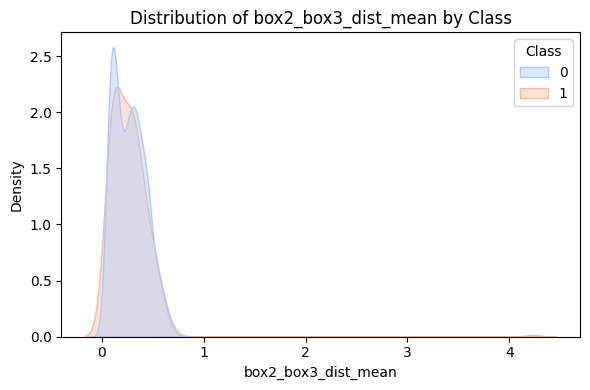

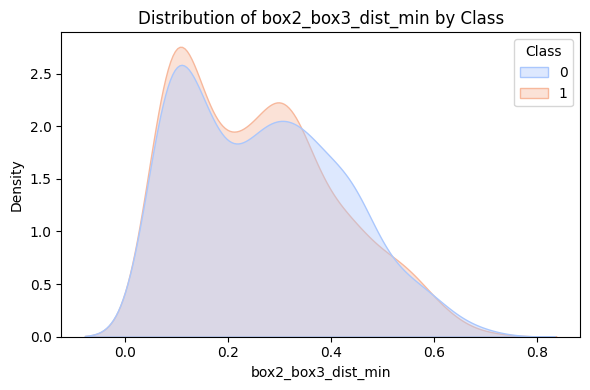

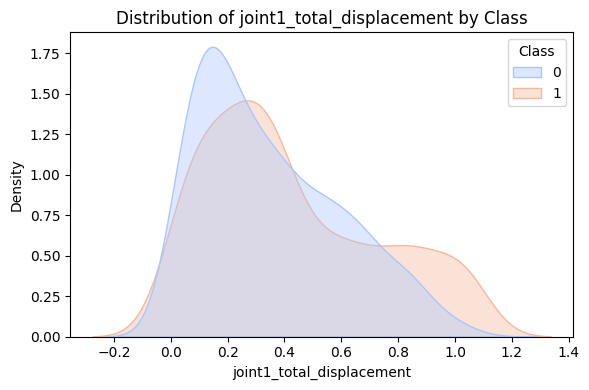

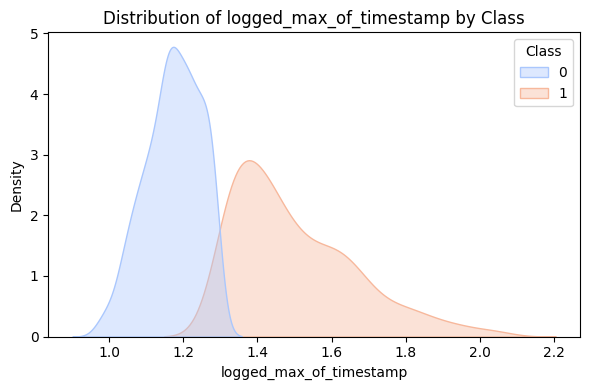

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=df, x=feature, hue='Class', fill=True, common_norm=False, alpha=0.4, palette='coolwarm')
    plt.title(f'Distribution of {feature} by Class')
    plt.tight_layout()
    plt.show()

/tmp/ipython-input-42-3841532687.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top['Class'] = df['Class']
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/valid

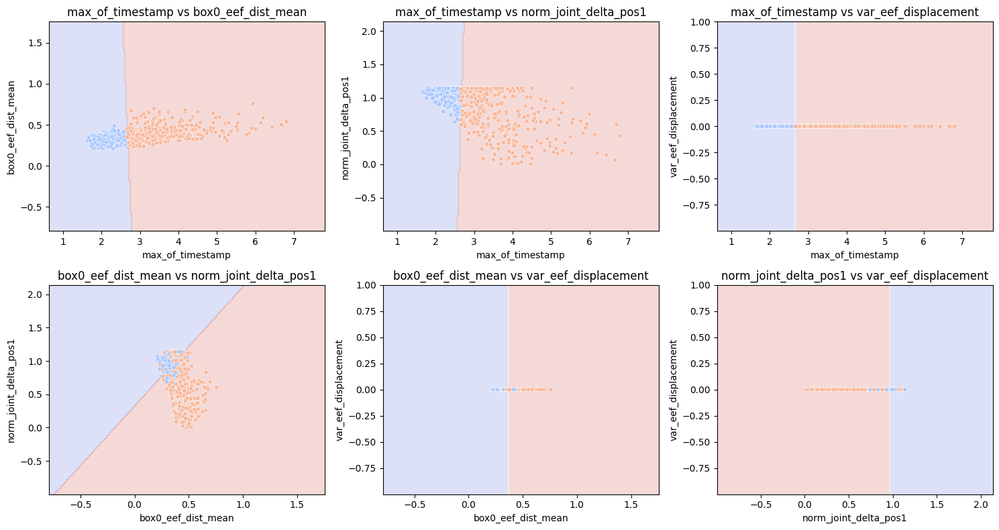

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from itertools import combinations

df_top = df[top_features]
df_top['Class'] = df['Class']
# df_top הוא הדאטהפריים שלך ו-'Class' היא עמודת היעד
features = df_top.drop(columns='Class').select_dtypes(include=['float64', 'int64']).columns
target = 'Class'

# קונפיגורציית הגריד
n_features = len(features)
n_cols = 3  # מספר עמודות בגריד
pairs = list(combinations(features, 2))
n_rows = int(np.ceil(len(pairs) / n_cols))

plt.figure(figsize=(5 * n_cols, 4 * n_rows))

for idx, (feat1, feat2) in enumerate(pairs):
    plt.subplot(n_rows, n_cols, idx + 1)

    X = df[[feat1, feat2]]
    y = df[target]

    # אימון המודל
    model = LogisticRegression().fit(X, y)

    # רשת נקודות לחישוב התחזית
    x_min, x_max = X[feat1].min() - 1, X[feat1].max() + 1
    y_min, y_max = X[feat2].min() - 1, X[feat2].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    # הצגה
    plt.contourf(xx, yy, Z, alpha=0.2, cmap='coolwarm')
    sns.scatterplot(x=feat1, y=feat2, hue=target, data=df, palette='coolwarm', s=20, edgecolor='w', legend=False)
    plt.xlabel(feat1)
    plt.ylabel(feat2)
    plt.title(f'{feat1} vs {feat2}')

plt.tight_layout()
plt.show()

# Modeling

In [ ]:
# based on analysis above
columns_to_drop = ['episode_index', 'box0_box1_quat_dot_mean',
       'box0_box1_quat_dot_min', 'box0_box1_quat_dot_max',
       'box0_box2_quat_dot_mean', 'box0_box2_quat_dot_min',
       'box0_box2_quat_dot_max', 'box0_box3_quat_dot_mean',
       'box0_box3_quat_dot_min', 'box0_box3_quat_dot_max',
       'box1_box2_quat_dot_mean', 'box1_box2_quat_dot_min',
       'box1_box2_quat_dot_max', 'box1_box3_quat_dot_mean',
       'box1_box3_quat_dot_min', 'box1_box3_quat_dot_max',
       'box2_box3_quat_dot_mean', 'box2_box3_quat_dot_min',
       'box2_box3_quat_dot_max', 'Class']

## normalization

In [ ]:
episode_table['logged_max_of_timestamp'] = np.log(episode_table['max_of_timestamp'])

In [ ]:
episode_table.columns

Index(['episode_index', 'max_of_timestamp', 'displacement_sum',
       'var_eef_displacement', 'norm_joint_delta_pos1',
       'norm_joint_delta_pos2', 'norm_joint_delta_pos3',
       'norm_joint_delta_pos4', 'norm_joint_delta_pos5',
       'norm_joint_delta_pos6', 'norm_joint_delta_pos7',
       'norm_joint_delta_pos_total', 'joint_delta_pos_7_switches',
       'box0_eef_dist_mean', 'box0_eef_dist_max', 'box1_eef_dist_mean',
       'box1_eef_dist_max', 'box2_eef_dist_mean', 'box2_eef_dist_max',
       'box3_eef_dist_mean', 'box3_eef_dist_min', 'box3_eef_dist_max',
       'box0_eef_quat_angle_mean', 'box0_eef_quat_angle_min',
       'box0_eef_quat_angle_max', 'box1_eef_quat_angle_mean',
       'box1_eef_quat_angle_min', 'box1_eef_quat_angle_max',
       'box2_eef_quat_angle_mean', 'box2_eef_quat_angle_min',
       'box2_eef_quat_angle_max', 'box3_eef_quat_angle_mean',
       'box3_eef_quat_angle_min', 'box3_eef_quat_angle_max',
       'box0_box1_quat_dot_mean', 'box0_box2_quat_dot_mean

In [ ]:
df = episode_table.copy()

# Drop non-feature columns if necessary
columns_to_drop = [col for col in columns_to_drop if col in df.columns]
df = df.drop(columns=columns_to_drop)  # Drop if not needed for modeling

excluded_column = ['max_of_timestamp', 'logged_max_of_timestamp', 'binned_dist', 'binned_displacement']

# Create a copy of the DataFrame to store normalized data
episode_table_normalized = episode_table.copy()

# List of columns to normalize (excluding the specific column)
columns_to_normalize = [col for col in df.columns if col not in excluded_column]

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform only the columns to normalize
episode_table_normalized[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])

In [ ]:
df = episode_table_normalized.copy()

# Drop non-feature columns if necessary
df = df.drop(columns=columns_to_drop)  # Drop if not needed for modeling

# Define target and predictors
y = df["logged_max_of_timestamp"]
# y = df["max_of_timestamp"]
X = df.drop(columns=excluded_column)

In [ ]:
interval_columns = [col for col in df[columns_to_normalize].columns if pd.api.types.is_interval_dtype(df[col])]
print("Interval columns:", interval_columns)

Interval columns: []


/tmp/ipython-input-48-1558417925.py:1: DeprecationWarning: is_interval_dtype is deprecated and will be removed in a future version. Use `isinstance(dtype, pd.IntervalDtype)` instead
  interval_columns = [col for col in df[columns_to_normalize].columns if pd.api.types.is_interval_dtype(df[col])]


In [ ]:
df = df.drop(columns=['binned_dist', 'binned_displacement'])

In [ ]:
X.shape

(800, 42)

In [ ]:
# also drop zero corr columns

import numpy as np
import pandas as pd

# Compute Pearson correlation for each feature with target
correlations = X.apply(lambda col: np.corrcoef(col, y.squeeze())[0, 1])

# Replace NaNs with 0 (in case of constant columns)
correlations = correlations.fillna(0)

# Define threshold: here strictly zero correlation
mask = np.abs(correlations) > 0.05

# Select only features with non-zero correlation
X_filtered = X.loc[:, mask]

# Optional: print removed columns
removed = X.columns[~mask]
print("Removed features with zero correlation:", list(removed))


Removed features with zero correlation: ['box2_eef_dist_max', 'box3_eef_dist_min', 'box0_box2_dist_mean', 'box0_box3_dist_min', 'box1_box3_dist_mean', 'box2_box3_dist_mean', 'box2_box3_dist_min']


In [ ]:
X = X_filtered

In [ ]:
X.shape

(800, 35)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Forward Stepwise Regression

In [ ]:
import statsmodels.api as sm
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

def cross_val_mse(model_func, X, y, predictors, n_splits=5, random_state=42):
    """
    Computes the average cross-validation MSE for a given set of predictors.
    """
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    mse_list = []

    for train_idx, val_idx in kf.split(X):
        X_train_cv, X_val_cv = X.iloc[train_idx], X.iloc[val_idx]
        y_train_cv, y_val_cv = y.iloc[train_idx], y.iloc[val_idx]

        # Fit model
        X_train_const = sm.add_constant(X_train_cv[predictors])
        model = sm.OLS(y_train_cv, X_train_const).fit()

        # Predict on validation fold
        X_val_const = sm.add_constant(X_val_cv[predictors], has_constant='add')
        y_pred = model.predict(X_val_const)

        mse = mean_squared_error(y_val_cv, y_pred)
        mse_list.append(mse)

    return np.mean(mse_list)

In [ ]:
def forward_stepwise_selection_cv(X, y, verbose=True, n_splits=5):
    predictors = []
    remaining = set(X.columns)
    best_models = []

    for k in range(len(X.columns)):
        best_mse = np.inf
        best_model = None
        best_predictor = None

        for predictor in remaining:
            trial_predictors = predictors + [predictor]
            # Compute cross-validation MSE
            mse = cross_val_mse(sm.OLS, X, y, trial_predictors, n_splits=n_splits)

            if mse < best_mse:
                best_mse = mse
                # Train the final model with all data for the selected predictors
                X_full = sm.add_constant(X[trial_predictors])
                model = sm.OLS(y, X_full).fit()
                best_model = model
                best_predictor = predictor

        if best_models and best_mse > best_models[-1][2] * 3:
          print(f"Stop because the error is raising too much")
          break

        if best_predictor is not None:
            predictors.append(best_predictor)
            remaining.remove(best_predictor)
            best_models.append((best_model, predictors.copy(), best_mse))

            if verbose:
                print(f"Step {k+1}: Add '{best_predictor}' | Cross-Validated MSE = {best_mse:.4f}")

    return best_models

In [ ]:
# Usage:
best_models = forward_stepwise_selection_cv(X_train, y_train, n_splits=5)

#Select the model with the lowest CV MSE
final_model, final_features, final_mse = min(best_models, key=lambda x: x[2])

print("\n✅ Final Model Features Based on Cross-Validated MSE:")
print(final_features)
print(f"Final CV MSE: {final_mse:.4f}")
final_model.summary()

Step 1: Add 'box0_eef_dist_mean' | Cross-Validated MSE = 0.0470
Step 2: Add 'norm_joint_delta_pos1' | Cross-Validated MSE = 0.0386
Step 3: Add 'box0_box1_dist_mean' | Cross-Validated MSE = 0.0359
Step 4: Add 'joint_delta_pos_7_switches' | Cross-Validated MSE = 0.0341
Step 5: Add 'displacement_sum' | Cross-Validated MSE = 0.0330
Step 6: Add 'norm_joint_delta_pos4' | Cross-Validated MSE = 0.0318
Step 7: Add 'box1_eef_quat_angle_mean' | Cross-Validated MSE = 0.0313
Step 8: Add 'box1_eef_dist_max' | Cross-Validated MSE = 0.0310
Step 9: Add 'box1_eef_dist_mean' | Cross-Validated MSE = 0.0305
Step 10: Add 'var_eef_displacement' | Cross-Validated MSE = 0.0303
Step 11: Add 'box1_eef_quat_angle_min' | Cross-Validated MSE = 0.0302
Step 12: Add 'box1_eef_quat_angle_max' | Cross-Validated MSE = 0.0300
Step 13: Add 'box3_eef_quat_angle_max' | Cross-Validated MSE = 0.0300
Step 14: Add 'box2_eef_dist_mean' | Cross-Validated MSE = 0.0300
Step 15: Add 'box1_box2_dist_mean' | Cross-Validated MSE = 0.030

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     logged_max_of_timestamp   R-squared:                       0.648
Model:                                 OLS   Adj. R-squared:                  0.636
Method:                      Least Squares   F-statistic:                     54.15
Date:                     Tue, 01 Jul 2025   Prob (F-statistic):          6.33e-125
Time:                             15:04:32   Log-Likelihood:                 241.62
No. Observations:                      640   AIC:                            -439.2
Df Residuals:                          618   BIC:                            -341.1
Df Model:                               21                                         
Covariance Type:                 nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          1.0237      0.007    153.074      0.000       1.011       1.037
box0_eef_dist_mean             0.1007      0.014      7.249      0.000       0.073       0.128
norm_joint_delta_pos1         -0.1144      0.012     -9.358      0.000      -0.138      -0.090
box0_box1_dist_mean            0.0446      0.009      4.875      0.000       0.027       0.063
joint_delta_pos_7_switches     0.0410      0.021      1.917      0.056      -0.001       0.083
displacement_sum              -0.0439      0.010     -4.271      0.000      -0.064      -0.024
norm_joint_delta_pos4          0.0161      0.010      1.546      0.123      -0.004       0.037
box1_eef_quat_angle_mean       0.0981      0.031      3.140      0.002       0.037       0.159
box1_eef_dist_max             -0.0791      0.018     -4.420      0.000      -0.114      -0.044
box1_eef_dist_mean             0.0700      0.020      3.438      0.001       0.030       0.110
var_eef_displacement           0.0361      0.012      2.907      0.004       0.012       0.060
box1_eef_quat_angle_min       -0.0536      0.019     -2.786      0.006      -0.091      -0.016
box1_eef_quat_angle_max       -0.0274      0.021     -1.312      0.190      -0.069       0.014
box3_eef_quat_angle_max       -0.0124      0.010     -1.299      0.194      -0.031       0.006
box2_eef_dist_mean            -0.0126      0.007     -1.709      0.088      -0.027       0.002
box1_box2_dist_mean            0.0090      0.007      1.246      0.213      -0.005       0.023
box1_box3_dist_min            -0.0088      0.007     -1.226      0.221      -0.023       0.005
norm_joint_delta_pos6         -0.0545      0.011     -4.777      0.000      -0.077      -0.032
norm_joint_delta_pos7         -0.1455      0.033     -4.423      0.000      -0.210      -0.081
norm_joint_delta_pos_total     0.0919      0.020      4.655      0.000       0.053       0.131
norm_joint_delta_pos5         -0.0584      0.014     -4.179      0.000      -0.086      -0.031
joint1_total_displacement     -0.0165      0.009     -1.885      0.060      -0.034       0.001
==============================================================================
Omnibus:                       89.980   Durbin-Watson:                   2.096
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              136.808
Skew:                           0.936   Prob(JB):                     1.96e-30
Kurtosis:                       4.274   Cond. No.                         15.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

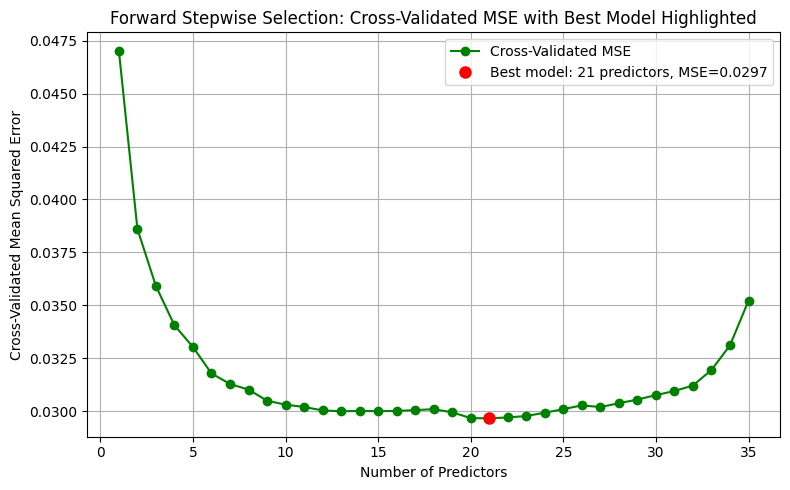

In [ ]:
# Visualize the results
# Extract MSE values and number of predictors
mse_values = [m[2] for m in best_models]
num_predictors = [len(m[1]) for m in best_models]

# # Plot Test MSE vs. Number of Predictors
# plt.figure(figsize=(8, 5))
# plt.plot(num_predictors, mse_values, 'go-', label="Cross-Validated MSE")
# plt.xlabel("Number of Predictors")
# plt.ylabel("Cross-Validated Mean Squared Error")
# plt.title("Forward Stepwise Selection: Cross-Validated MSE")
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# Plot with best model highlighted
best_idx = mse_values.index(min(mse_values))
best_num_predictors = num_predictors[best_idx]
best_mse = mse_values[best_idx]

plt.figure(figsize=(8, 5))
plt.plot(num_predictors, mse_values, 'go-', label="Cross-Validated MSE")
plt.plot(best_num_predictors, best_mse, 'ro', markersize=8,
         label=f"Best model: {best_num_predictors} predictors, MSE={best_mse:.4f}")
plt.xlabel("Number of Predictors")
plt.ylabel("Cross-Validated Mean Squared Error")
plt.title("Forward Stepwise Selection: Cross-Validated MSE with Best Model Highlighted")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
final_r_squared = final_model.rsquared
print(f"The R_squared of the model is: {final_r_squared:.4f}")

The R_squared of the model is: 0.6479


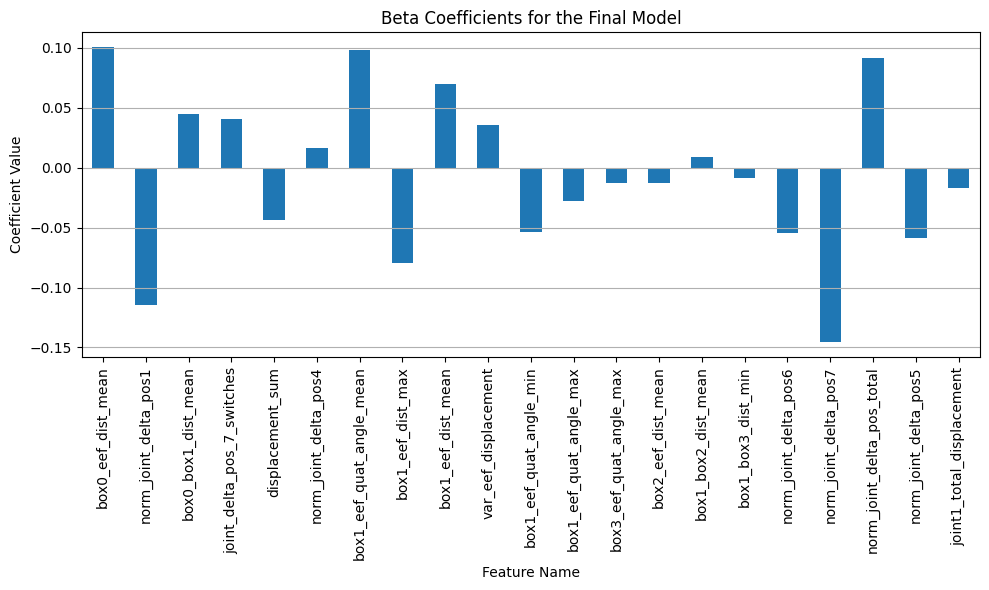

In [ ]:
# Column Plot of Beta Coefficients for the Final Model
final_betas = final_model.params.drop('const', errors='ignore') # Drop the intercept
if not final_betas.empty:
    plt.figure(figsize=(10, 6))
    final_betas.plot(kind='bar')
    plt.title("Beta Coefficients for the Final Model")
    plt.xlabel("Feature Name")
    plt.ylabel("Coefficient Value")
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()
else:
    print("\n⚠️ No features selected for the final model, so no beta coefficients to plot.")

In [ ]:
print(final_betas)

box0_eef_dist_mean            0.100707
norm_joint_delta_pos1        -0.114366
box0_box1_dist_mean           0.044632
joint_delta_pos_7_switches    0.041044
displacement_sum             -0.043874
norm_joint_delta_pos4         0.016119
box1_eef_quat_angle_mean      0.098072
box1_eef_dist_max            -0.079109
box1_eef_dist_mean            0.070021
var_eef_displacement          0.036082
box1_eef_quat_angle_min      -0.053586
box1_eef_quat_angle_max      -0.027437
box3_eef_quat_angle_max      -0.012376
box2_eef_dist_mean           -0.012630
box1_box2_dist_mean           0.009029
box1_box3_dist_min           -0.008821
norm_joint_delta_pos6        -0.054484
norm_joint_delta_pos7        -0.145498
norm_joint_delta_pos_total    0.091854
norm_joint_delta_pos5        -0.058369
joint1_total_displacement    -0.016539
dtype: float64


## Lasso Regression

In [ ]:
def lasso_cross_validation(X, y, alphas=None, n_folds=5, random_state=42):
    """
    Performs Lasso regression with cross-validation to select the optimal alpha (lambda).

    Args:
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray, optional): Array of alpha values to try. If None, LassoCV will use its own.
        n_folds (int): Number of cross-validation folds.
        random_state (int): Random seed for reproducibility.

    Returns:
        tuple: (best_alpha, mse_values, alphas_used, fitted_lasso_cv)
               - best_alpha (float): The optimal alpha value found by cross-validation.
               - mse_values (np.ndarray): Array of mean squared errors for each alpha value.
               - alphas_used (np.ndarray): The actual alpha values used during cross-validation.
               - fitted_lasso_cv (LassoCV): The fitted LassoCV object.
    """

    lasso_cv = LassoCV(alphas=alphas, cv=n_folds, random_state=random_state, n_jobs=-1)
    lasso_cv.fit(X, y)

    return lasso_cv.alpha_, lasso_cv.mse_path_.mean(axis=-1), lasso_cv.alphas_, lasso_cv



✅ Best Alpha (Lambda) found by Cross-Validation: 0.00011489510001873086

✅ MSE Values for different Alphas:
 100.000000    0.078720
93.293040     0.078720
87.035914     0.078720
81.198450     0.078720
75.752503     0.078720
                ...   
0.000132      0.031739
0.000123      0.031701
0.000115      0.031687
0.000107      0.031692
0.000100      0.031714
Length: 200, dtype: float64


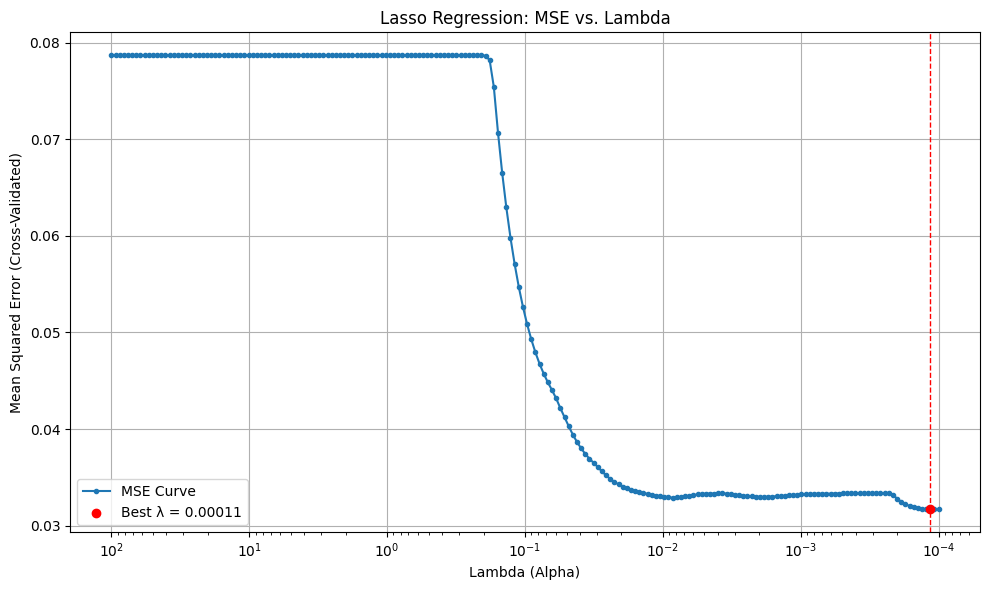

In [ ]:
# Usage:
# Assuming X and y are already defined as pandas DataFrame and Series respectively

# Define a range of alpha values to try (optional)
alphas_to_try = np.logspace(-4, 2, 200)

best_alpha, mse_values, alphas_used, lasso_cv_model = lasso_cross_validation(X_train, y_train, alphas=alphas_to_try, n_folds=5, random_state=42)

print("\n✅ Best Alpha (Lambda) found by Cross-Validation:", best_alpha)
print("\n✅ MSE Values for different Alphas:\n", pd.Series(mse_values, index=alphas_used))

# Get the best MSE for plotting
best_mse = np.min(mse_values)

# Plot MSE as a function of Lambda (Alpha)
plt.figure(figsize=(10, 6))
plt.plot(alphas_used, mse_values, marker='.', linestyle='-', label='MSE Curve')
plt.scatter(best_alpha, best_mse, color='red', zorder=5, label=f'Best λ = {best_alpha:.5f}')
plt.axvline(best_alpha, color='red', linestyle='--', linewidth=1)

plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Mean Squared Error (Cross-Validated)')
plt.title('Lasso Regression: MSE vs. Lambda')
plt.grid(True)
plt.gca().invert_xaxis()  # Optional: Invert x-axis to show larger alpha on the left
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
best_coefficients = pd.Series(lasso_cv_model.coef_, index=X.columns)
print("\n✅ Coefficients of the Best Lasso Model:")
print(best_coefficients)


✅ Coefficients of the Best Lasso Model:
displacement_sum             -0.045920
var_eef_displacement          0.032795
norm_joint_delta_pos1        -0.100686
norm_joint_delta_pos2        -0.009497
norm_joint_delta_pos3        -0.027870
norm_joint_delta_pos4         0.010460
norm_joint_delta_pos5        -0.058103
norm_joint_delta_pos6        -0.060826
norm_joint_delta_pos7        -0.162563
norm_joint_delta_pos_total    0.104908
joint_delta_pos_7_switches    0.048469
box0_eef_dist_mean            0.125378
box0_eef_dist_max            -0.001036
box1_eef_dist_mean            0.073777
box1_eef_dist_max            -0.080336
box2_eef_dist_mean           -0.008965
box3_eef_dist_mean           -0.032758
box3_eef_dist_max             0.043630
box0_eef_quat_angle_mean      0.026868
box0_eef_quat_angle_min      -0.018319
box0_eef_quat_angle_max       0.005094
box1_eef_quat_angle_mean      0.087074
box1_eef_quat_angle_min      -0.044197
box1_eef_quat_angle_max      -0.029638
box2_eef_quat_angle_mea

In [ ]:
final_r_squared = lasso_cv_model.score(X_train, y_train)
print(f"The R squared of the model is: {final_r_squared:.4f}")

The R squared of the model is: 0.6592


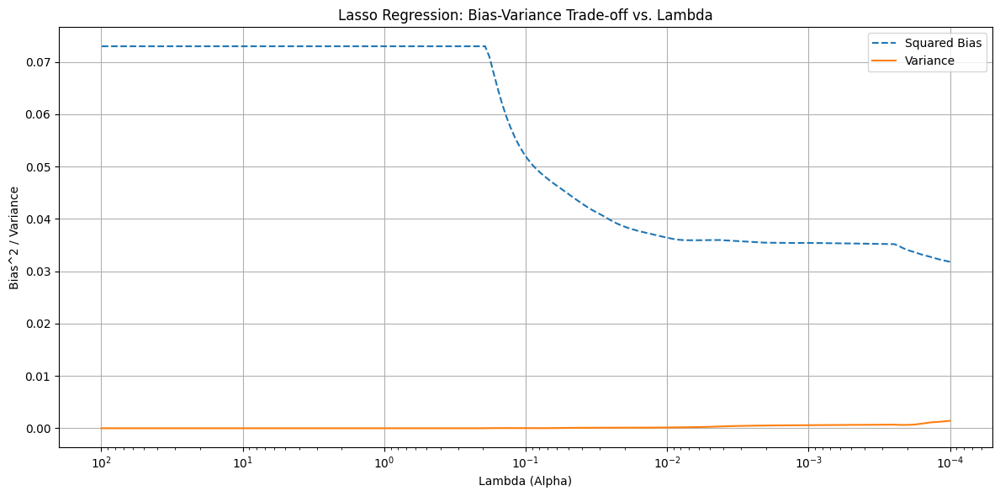

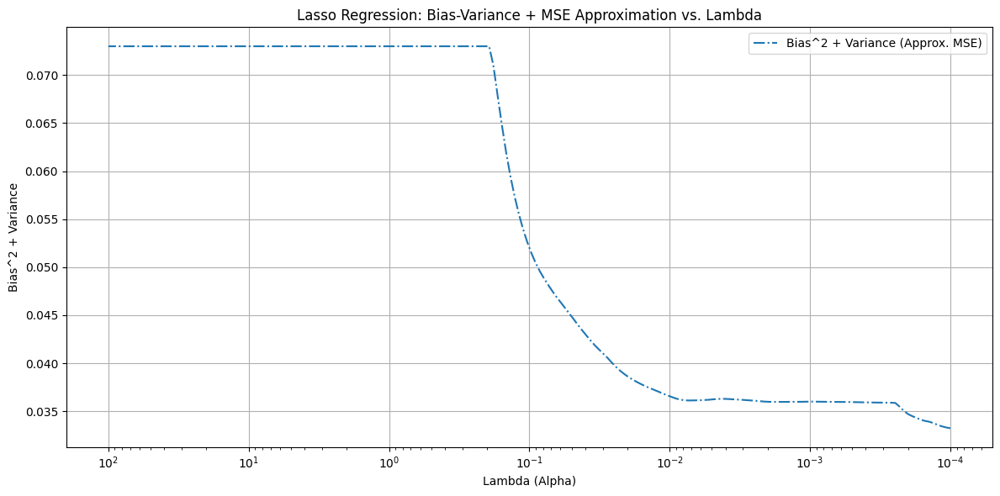

In [ ]:
def estimate_bias_variance(X, y, alphas, n_splits=5, random_state=42):
    """
    Estimates the bias and variance for different alpha values in Lasso regression
    using cross-validation.

    Args:ac
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray): Array of alpha values to try.
        n_splits (int): Number of cross-validation folds.
        random_state (int): Random seed for reproducibility.

    Returns:
        tuple: (alphas, bias_squared_values, variance_values)
               - alphas (np.ndarray): The alpha values used.
               - bias_squared_values (np.ndarray): Estimated squared bias for each alpha.
               - variance_values (np.ndarray): Estimated variance for each alpha.
    """
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

    bias_squared_values = []
    variance_values = []

    # We'll use a single train-test split to estimate the "true" model performance
    X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y, test_size=0.3, random_state=random_state)

    for alpha in alphas:
        predictions = []
        models = []
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

        for train_idx, val_idx in kf.split(X_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

            lasso = Lasso(alpha=alpha, random_state=random_state)
            lasso.fit(X_train_fold, y_train_fold)
            models.append(lasso)
            predictions.append(lasso.predict(X_test))

        # Estimate Bias^2 (squared difference between average prediction and true value)
        avg_prediction = np.mean(predictions, axis=0)
        bias_squared = np.mean((avg_prediction - y_test)**2)
        bias_squared_values.append(bias_squared)

        # Estimate Variance (average squared difference of predictions around their mean)
        variance = np.mean(np.var(predictions, axis=0))
        variance_values.append(variance)

    return alphas, np.array(bias_squared_values), np.array(variance_values)

# Usage:
# Assuming X and y are already defined

# Define a range of alpha values to try
alphas_to_try = np.logspace(-4, 2, 200)

# Estimate bias and variance
alphas_plot, bias_sq, variance = estimate_bias_variance(X, y, alphas_to_try, n_splits=5, random_state=42)

# Plot Bias^2 and Variance as a function of Lambda (Alpha)
plt.figure(figsize=(12, 6))
plt.plot(alphas_plot, bias_sq, label='Squared Bias', linestyle='--')
plt.plot(alphas_plot, variance, label='Variance', linestyle='-')
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Bias^2 / Variance')
plt.title('Lasso Regression: Bias-Variance Trade-off vs. Lambda')
plt.legend()
plt.grid(True)
plt.gca().invert_xaxis() # Optional: Invert x-axis
plt.tight_layout()


# Combine and plot Bias^2 + Variance (approximation of MSE)
plt.figure(figsize=(12, 6))
plt.plot(alphas_plot, bias_sq + variance, label='Bias^2 + Variance (Approx. MSE)', linestyle='-.')
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Bias^2 + Variance')
plt.title('Lasso Regression: Bias-Variance + MSE Approximation vs. Lambda')
plt.legend()
plt.grid(True)
plt.gca().invert_xaxis() # Optional: Invert x-axis
plt.tight_layout()
plt.show()

## Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge



def ridge_cross_validation(X, y, alphas=None, n_folds=5, scoring='neg_mean_squared_error'):
    """
    Performs Ridge regression with cross-validation to select the optimal alpha (lambda).

    Args:
        X (pd.DataFrame): Feature matrix.
        y (pd.Series): Target variable.
        alphas (np.ndarray, optional): Array of alpha values to try.
        n_folds (int): Number of cross-validation folds.
        scoring (str): Scoring metric for cross-validation.

    Returns:
        tuple: (best_alpha, mse_values, alphas_used, fitted_ridge_cv)
               - best_alpha (float): The optimal alpha value found by cross-validation.
               - mse_values (np.ndarray): Mean squared error for each alpha.
               - alphas (np.ndarray): The alpha values tested.
               - fitted_ridge_cv (RidgeCV): The fitted RidgeCV object.
    """

    ridge_cv = RidgeCV(alphas=alphas, cv=n_folds, scoring=scoring)
    ridge_cv.fit(X, y)

    # Note: RidgeCV does not expose MSE path directly; we'll compute manually
    mse_values = []
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    for alpha in alphas:
        model = sm.OLS if hasattr(sm, 'OLS') else Ridge(alpha=alpha)
        fold_mse = []
        for train_idx, val_idx in kf.split(X):
            X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

            ridge = RidgeCV(alphas=[alpha])
            ridge.fit(X_train, y_train)
            y_pred = ridge.predict(X_val)
            fold_mse.append(mean_squared_error(y_val, y_pred))
        mse_values.append(np.mean(fold_mse))

    return ridge_cv.alpha_, np.array(mse_values), alphas, ridge_cv


✅ Best Alpha (Lambda) found by Cross-Validation: 1.350993521198025

✅ MSE Values for different Alphas:
 0.000100      0.035221
0.000107      0.035221
0.000115      0.035221
0.000123      0.035220
0.000132      0.035220
                ...   
75.752503     0.033987
81.198450     0.034059
87.035914     0.034135
93.293040     0.034215
100.000000    0.034300
Length: 200, dtype: float64


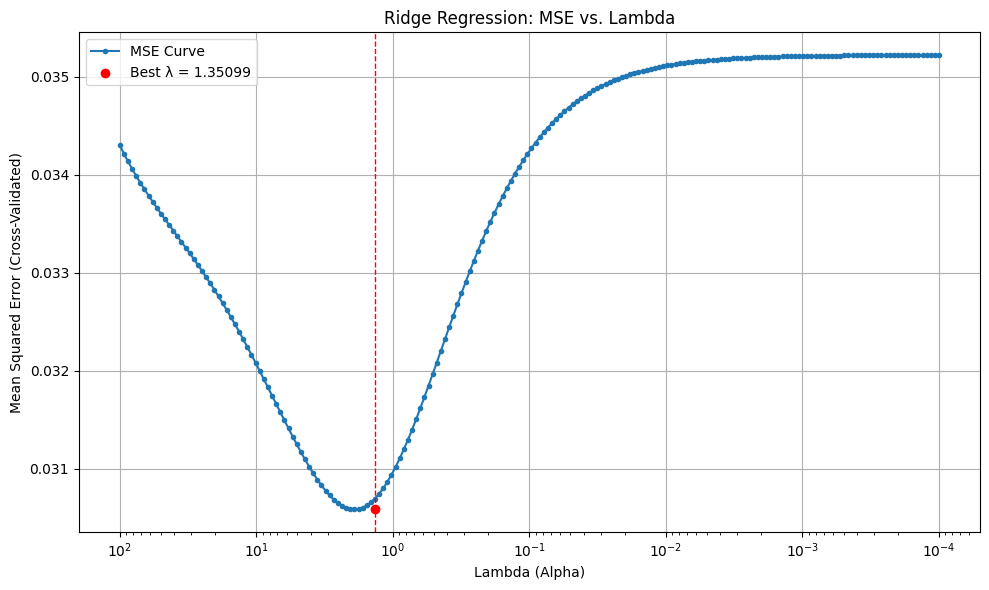

In [ ]:
alphas_to_try = np.logspace(-4, 2, 200)

best_alpha, mse_values, alphas_used, ridge_cv_model = ridge_cross_validation(X_train, y_train, alphas=alphas_to_try, n_folds=5)

print("\n✅ Best Alpha (Lambda) found by Cross-Validation:", best_alpha)
print("\n✅ MSE Values for different Alphas:\n", pd.Series(mse_values, index=alphas_used))

# Get the best MSE value for highlighting
best_mse = np.min(mse_values)

# Plot MSE vs. Alpha
plt.figure(figsize=(10, 6))
plt.plot(alphas_used, mse_values, marker='.', linestyle='-', label='MSE Curve')

# Highlight the best alpha
plt.scatter(best_alpha, best_mse, color='red', zorder=5, label=f'Best λ = {best_alpha:.5f}')
plt.axvline(best_alpha, color='red', linestyle='--', linewidth=1)

# Plot formatting
plt.xscale('log')
plt.xlabel('Lambda (Alpha)')
plt.ylabel('Mean Squared Error (Cross-Validated)')
plt.title('Ridge Regression: MSE vs. Lambda')
plt.grid(True)
plt.gca().invert_xaxis()
plt.legend()
plt.tight_layout()
plt.show()


✅ Coefficients of the Best Ridge Model:
displacement_sum             -0.045885
var_eef_displacement          0.032181
norm_joint_delta_pos1        -0.100265
norm_joint_delta_pos2        -0.008417
norm_joint_delta_pos3        -0.025865
norm_joint_delta_pos4         0.012405
norm_joint_delta_pos5        -0.056310
norm_joint_delta_pos6        -0.058830
norm_joint_delta_pos7        -0.154092
norm_joint_delta_pos_total    0.099783
joint_delta_pos_7_switches    0.044018
box0_eef_dist_mean            0.125501
box0_eef_dist_max            -0.001475
box1_eef_dist_mean            0.073303
box1_eef_dist_max            -0.079768
box2_eef_dist_mean           -0.008883
box3_eef_dist_mean           -0.032715
box3_eef_dist_max             0.043211
box0_eef_quat_angle_mean      0.027823
box0_eef_quat_angle_min      -0.018997
box0_eef_quat_angle_max       0.004779
box1_eef_quat_angle_mean      0.086652
box1_eef_quat_angle_min      -0.043950
box1_eef_quat_angle_max      -0.029501
box2_eef_quat_angle_mea

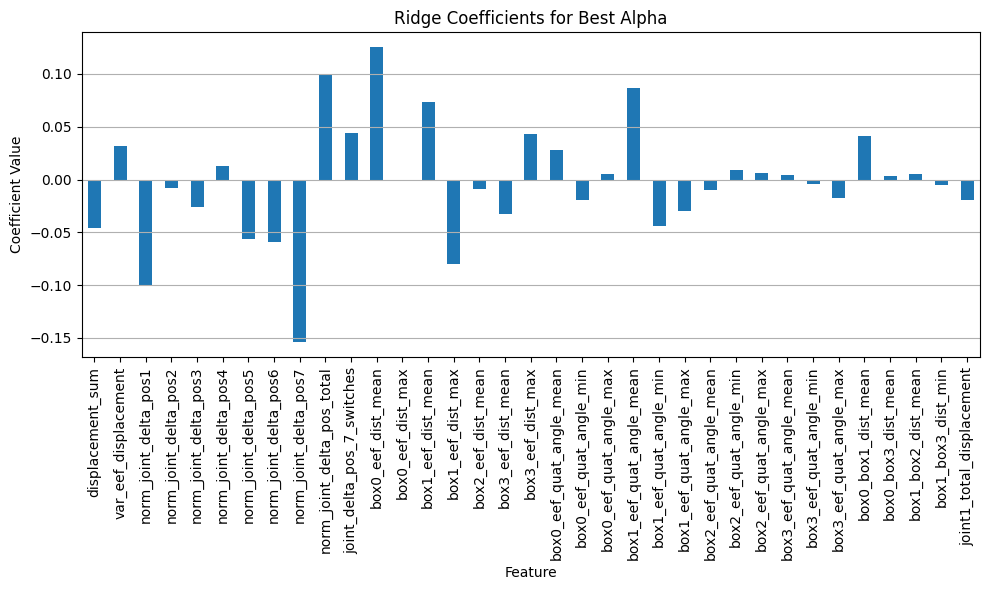

In [ ]:
# Best coefficients
best_coefficients = pd.Series(ridge_cv_model.coef_, index=X.columns)
print("\n✅ Coefficients of the Best Ridge Model:")
print(best_coefficients)

# Plot coefficients
plt.figure(figsize=(10, 6))
best_coefficients.plot(kind='bar')
plt.title('Ridge Coefficients for Best Alpha')
plt.xlabel('Feature')
plt.ylabel('Coefficient Value')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [ ]:
# Determine the R-squared value of the best Ridge model
final_r_squared = ridge_cv_model.score(X, y)

print(f"The  R-squared of the final model is: {final_r_squared:.4f}")

The  R-squared of the final model is: 0.6418


##Random Forest + Bagging

Dataset shape: (640, 35)
Features: 35, Samples: 640
Training set: 512 samples
Test set: 128 samples
Testing 10 different tree counts: 10 to 190
Target variance: 0.0804
Feature subsampling - Full: 35, Half: 17, Sqrt: 5, Log2: 5

Progress: 1/10 - Testing 10 trees...


/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_bagging.py:1315: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/ensemble/_forest.py:612: UserWarning: Some inputs do not have OOB scores. This probably means

Iteration completed in 3.92s

Progress: 2/10 - Testing 30 trees...
Iteration completed in 2.43s

Progress: 3/10 - Testing 50 trees...
Iteration completed in 2.96s

Progress: 4/10 - Testing 70 trees...
Iteration completed in 2.79s

Progress: 5/10 - Testing 90 trees...
Iteration completed in 3.59s

Progress: 6/10 - Testing 110 trees...
Iteration completed in 6.22s

Progress: 7/10 - Testing 130 trees...
Iteration completed in 6.04s

Progress: 8/10 - Testing 150 trees...
Iteration completed in 5.87s

Progress: 9/10 - Testing 170 trees...
Iteration completed in 9.47s

Progress: 10/10 - Testing 190 trees...
Iteration completed in 7.81s


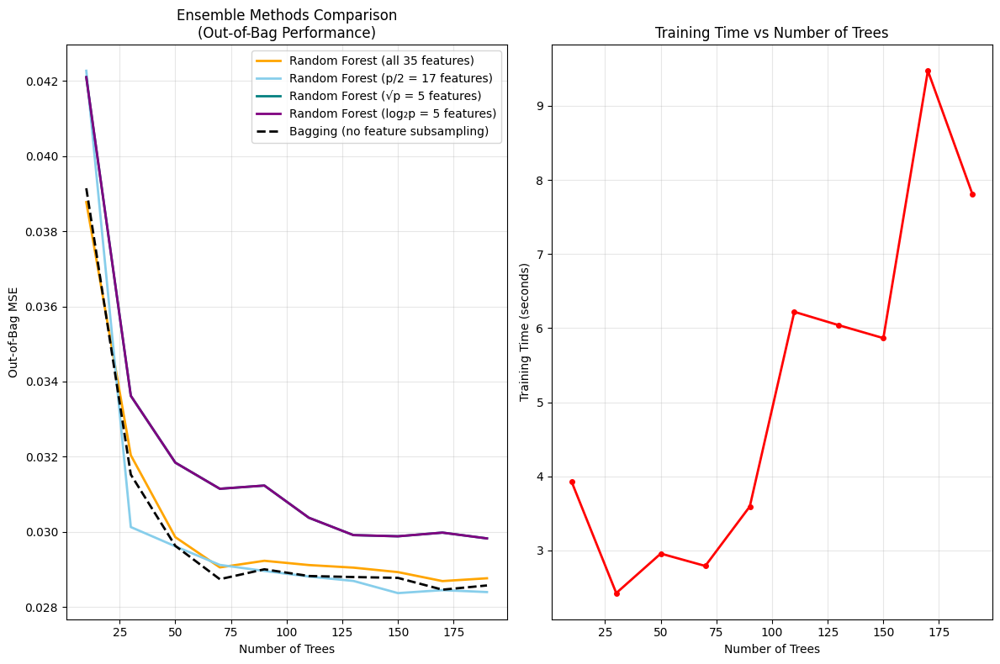


PERFORMANCE SUMMARY
Bagging              | Best: 0.0285 @ 170 trees | Final: 0.0286
RF (all features)    | Best: 0.0287 @ 170 trees | Final: 0.0288
RF (p/2)             | Best: 0.0284 @ 150 trees | Final: 0.0284
RF (√p)              | Best: 0.0298 @ 190 trees | Final: 0.0298
RF (log₂p)           | Best: 0.0298 @ 190 trees | Final: 0.0298
Total training time: 51.10 seconds


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import time

def compare_ensemble_methods(X, y, max_trees=200, step_size=20, test_size=0.2, random_state=42):
    """
    Compare different ensemble methods using OOB scores.

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        Feature matrix
    y : array-like, shape (n_samples,)
        Target values
    max_trees : int, default=200
        Maximum number of trees to test
    step_size : int, default=20
        Step size for number of trees
    test_size : float, default=0.2
        Proportion of data to hold out for final validation
    random_state : int, default=42
        Random state for reproducibility

    Returns:
    --------
    dict : Dictionary containing results and fitted models
    """

    print(f"Dataset shape: {X.shape}")
    print(f"Features: {X.shape[1]}, Samples: {X.shape[0]}")

    # Split data - keep larger portion for training to get better OOB estimates
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    print(f"Training set: {X_train.shape[0]} samples")
    print(f"Test set: {X_test.shape[0]} samples")

    # Set range of number of trees (optimized for your dataset size)
    n_trees_list = np.arange(10, max_trees + 1, step_size)
    print(f"Testing {len(n_trees_list)} different tree counts: {n_trees_list[0]} to {n_trees_list[-1]}")

    # Initialize results storage
    results = {
        'n_trees': n_trees_list,
        'oob_mse_bagging': [],
        'oob_mse_rf_full': [],
        'oob_mse_rf_half': [],
        'oob_mse_rf_sqrt': [],
        'oob_mse_rf_log2': [],  # Added log2(p) option
        'training_times': []
    }

    # Calculate variance of y_train for converting OOB R^2 to MSE
    y_train_variance = np.var(y_train)
    print(f"Target variance: {y_train_variance:.4f}")

    # Feature counts for different Random Forest configurations
    n_features = X_train.shape[1]
    features_full = n_features
    features_half = max(1, n_features // 2)
    features_sqrt = max(1, int(np.sqrt(n_features)))
    features_log2 = max(1, int(np.log2(n_features)))

    print(f"Feature subsampling - Full: {features_full}, Half: {features_half}, "
          f"Sqrt: {features_sqrt}, Log2: {features_log2}")

    # Iterate over number of trees
    for i, n_trees in enumerate(n_trees_list):
        print(f"\nProgress: {i+1}/{len(n_trees_list)} - Testing {n_trees} trees...")
        iteration_start = time.time()

        # 1. Bagging (full features, no feature subsampling)
        try:
            bag = BaggingRegressor(
                estimator=DecisionTreeRegressor(max_depth=10, min_samples_split=5),  # Limit depth for speed
                n_estimators=n_trees,
                max_features=1.0,  # Use all features
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            bag.fit(X_train, y_train)

            if not np.isnan(bag.oob_score_) and bag.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - bag.oob_score_)
                results['oob_mse_bagging'].append(oob_mse)
            else:
                results['oob_mse_bagging'].append(np.nan)
        except Exception as e:
            print(f"Bagging failed: {e}")
            results['oob_mse_bagging'].append(np.nan)

        # 2. Random Forest with all features
        try:
            rf_full = RandomForestRegressor(
                n_estimators=n_trees,
                max_features=features_full,
                max_depth=10,  # Limit depth for speed
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_full.fit(X_train, y_train)

            if not np.isnan(rf_full.oob_score_) and rf_full.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_full.oob_score_)
                results['oob_mse_rf_full'].append(oob_mse)
            else:
                results['oob_mse_rf_full'].append(np.nan)
        except Exception as e:
            print(f"RF Full failed: {e}")
            results['oob_mse_rf_full'].append(np.nan)

        # 3. Random Forest with half features
        try:
            rf_half = RandomForestRegressor(
                n_estimators=n_trees,
                max_features=features_half,
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_half.fit(X_train, y_train)

            if not np.isnan(rf_half.oob_score_) and rf_half.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_half.oob_score_)
                results['oob_mse_rf_half'].append(oob_mse)
            else:
                results['oob_mse_rf_half'].append(np.nan)
        except Exception as e:
            print(f"RF Half failed: {e}")
            results['oob_mse_rf_half'].append(np.nan)

        # 4. Random Forest with sqrt(p) features
        try:
            rf_sqrt = RandomForestRegressor(
                n_estimators=n_trees,
                max_features='sqrt',  # sklearn handles this automatically
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_sqrt.fit(X_train, y_train)

            if not np.isnan(rf_sqrt.oob_score_) and rf_sqrt.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_sqrt.oob_score_)
                results['oob_mse_rf_sqrt'].append(oob_mse)
            else:
                results['oob_mse_rf_sqrt'].append(np.nan)
        except Exception as e:
            print(f"RF Sqrt failed: {e}")
            results['oob_mse_rf_sqrt'].append(np.nan)

        # 5. Random Forest with log2(p) features
        try:
            rf_log2 = RandomForestRegressor(
                n_estimators=n_trees,
                max_features='log2',  # sklearn handles this automatically
                max_depth=10,
                min_samples_split=5,
                bootstrap=True,
                oob_score=True,
                random_state=random_state,
                n_jobs=-1
            )
            rf_log2.fit(X_train, y_train)

            if not np.isnan(rf_log2.oob_score_) and rf_log2.oob_score_ <= 1:
                oob_mse = y_train_variance * (1 - rf_log2.oob_score_)
                results['oob_mse_rf_log2'].append(oob_mse)
            else:
                results['oob_mse_rf_log2'].append(np.nan)
        except Exception as e:
            print(f"RF Log2 failed: {e}")
            results['oob_mse_rf_log2'].append(np.nan)


        iteration_time = time.time() - iteration_start
        results['training_times'].append(iteration_time)
        print(f"Iteration completed in {iteration_time:.2f}s")

    # Store test data for final validation if needed
    results['X_test'] = X_test
    results['y_test'] = y_test
    results['X_train'] = X_train
    results['y_train'] = y_train

    return results

def plot_ensemble_comparison(results, figsize=(12, 8)):
    """Plot the ensemble comparison results"""

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Main OOB MSE plot
    n_trees_list = results['n_trees']
    n_features = results['X_train'].shape[1]


    ax1.plot(n_trees_list, results['oob_mse_rf_full'],
             label=f"Random Forest (all {n_features} features)",
             color="orange", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_half'],
             label=f"Random Forest (p/2 = {max(1, n_features // 2)} features)",
             color="skyblue", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_sqrt'],
             label=f"Random Forest (√p = {max(1, int(np.sqrt(n_features)))} features)",
             color="teal", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_rf_log2'],
             label=f"Random Forest (log₂p = {max(1, int(np.log2(n_features)))} features)",
             color="purple", linewidth=2)
    ax1.plot(n_trees_list, results['oob_mse_bagging'],
             label="Bagging (no feature subsampling)",
             color="black", linestyle="--", linewidth=2)

    ax1.set_xlabel("Number of Trees")
    ax1.set_ylabel("Out-of-Bag MSE")
    ax1.set_title("Ensemble Methods Comparison\n(Out-of-Bag Performance)")
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Training time plot
    ax2.plot(n_trees_list, results['training_times'],
             color="red", marker='o', linewidth=2, markersize=4)
    ax2.set_xlabel("Number of Trees")
    ax2.set_ylabel("Training Time (seconds)")
    ax2.set_title("Training Time vs Number of Trees")
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\n"+"="*60)
    print("PERFORMANCE SUMMARY")
    print("="*60)

    methods = ['Bagging', 'RF (all features)', 'RF (p/2)', 'RF (√p)', 'RF (log₂p)']
    oob_results = [
        results['oob_mse_bagging'],
        results['oob_mse_rf_full'],
        results['oob_mse_rf_half'],
        results['oob_mse_rf_sqrt'],
        results['oob_mse_rf_log2']
    ]

    for method, mse_list in zip(methods, oob_results):
        # Filter out NaN values
        valid_mse = [mse for mse in mse_list if not np.isnan(mse)]
        if valid_mse:
            best_mse = min(valid_mse)
            best_idx = mse_list.index(best_mse)
            best_trees = n_trees_list[best_idx]
            final_mse = valid_mse[-1]
            print(f"{method:<20} | Best: {best_mse:.4f} @ {best_trees} trees | Final: {final_mse:.4f}")
        else:
            print(f"{method:<20} | No valid results")

    print("="*60)
    print(f"Total training time: {sum(results['training_times']):.2f} seconds")

# Example usage:
results = compare_ensemble_methods(X_train, y_train, max_trees=200, step_size=20)
plot_ensemble_comparison(results)

In [ ]:
# 2. Train Random Forest with m = sqrt(p), 100 trees, and OOB enabled
rf_sqrt = RandomForestRegressor(
    n_estimators=100,
    max_features='sqrt',     # m = sqrt(p)
    bootstrap=True,
    oob_score=True,
    random_state=42,
    n_jobs=-1
)
rf_sqrt.fit(X_train, y_train)

# 3. Compute OOB R^2 and Test R^2
oob_r2 = rf_sqrt.oob_score_
y_pred_test = rf_sqrt.predict(X_test)
test_r2 = r2_score(y_test, y_pred_test)

# 4. Print results
print(f"✅ OOB R² score:  {oob_r2:.3f}")
print(f"✅ Test R² score: {test_r2:.3f}")


✅ OOB R² score:  0.643
✅ Test R² score: 0.577


## grad boosting and svm

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.6 MB/s eta 0:00:00


Dataset: 640 samples, 35 features
Target range: [0.491, 1.902]

🟠 Training CatBoost...
   Test MSE: 0.0278
   Test R²: 0.5986
   CV MSE: 0.0311 (±0.0028)

🔵 Training SVM...
   Test MSE: 0.0260
   Test R²: 0.6242
   CV MSE: 0.0314 (±0.0066)


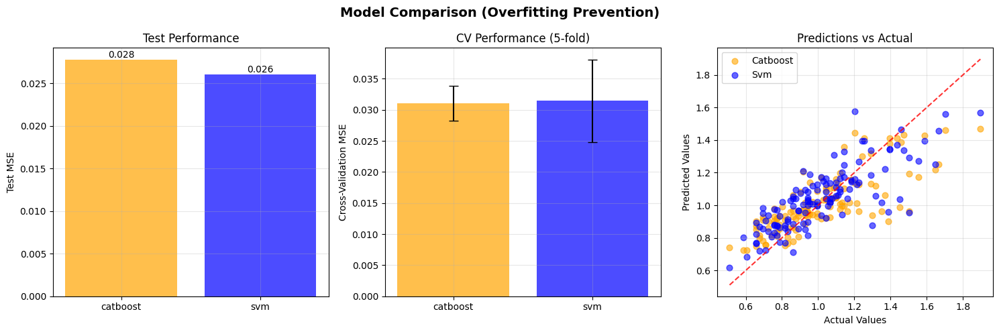


SUMMARY (with overfitting prevention)

CATBOOST:
  Test MSE: 0.0278
  Test R²:  0.5986
  CV MSE:   0.0311 (±0.0028)
  ✅ Good generalization

SVM:
  Test MSE: 0.0260
  Test R²:  0.6242
  CV MSE:   0.0314 (±0.0066)
  ✅ Good generalization

🏆 Best Model: SVM

🔍 OVERFITTING ANALYSIS
------------------------------

CATBOOST:
  CV MSE:    0.0311
  Test MSE:  0.0278
  Gap:       0.0033 (10.7%)
  Status:    ⚡ MODERATE OVERFITTING

SVM:
  CV MSE:    0.0314
  Test MSE:  0.0260
  Gap:       0.0054 (17.3%)
  Status:    ✅ GOOD GENERALIZATION


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# CatBoost import with error handling
try:
    from catboost import CatBoostRegressor
    CATBOOST_AVAILABLE = True
except ImportError:
    print("CatBoost not installed. Install with: pip install catboost")
    CATBOOST_AVAILABLE = False

def simple_model_comparison(X, y, test_size=0.2, random_state=42):
    """
    Simple comparison of CatBoost and SVM with strong overfitting prevention.

    Parameters:
    -----------
    X : array-like, shape (n_samples, n_features)
        Feature matrix
    y : array-like, shape (n_samples,)
        Target values
    test_size : float, default=0.2
        Proportion of data for testing
    random_state : int, default=42
        Random state for reproducibility

    Returns:
    --------
    dict : Dictionary containing results and fitted models
    """

    print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
    print(f"Target range: [{y.min():.3f}, {y.max():.3f}]")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    # Scale features for SVM
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    results = {}

    # =================================================================
    # CATBOOST - Conservative parameters to prevent overfitting
    # =================================================================
    if CATBOOST_AVAILABLE:
        print("\n🟠 Training CatBoost...")

        catboost_model = CatBoostRegressor(
            # Conservative settings to prevent overfitting
            iterations=100,              # Fewer iterations
            learning_rate=0.05,          # Lower learning rate
            depth=4,                     # Shallow trees
            l2_leaf_reg=10,              # Strong L2 regularization

            # Overfitting prevention
            early_stopping_rounds=20,    # Stop early if no improvement
            use_best_model=True,         # Use best model from validation
            eval_fraction=0.1,           # Use 10% for internal validation

            # Other settings
            random_state=random_state,
            verbose=False,
            bootstrap_type='Bayesian',   # More robust than default
            bagging_temperature=0.5      # Reduce overfitting in bagging
        )

        # Fit with validation set for early stopping
        catboost_model.fit(X_train, y_train)

        # Predictions and metrics
        y_pred_cat = catboost_model.predict(X_test)
        cat_mse = mean_squared_error(y_test, y_pred_cat)
        cat_r2 = r2_score(y_test, y_pred_cat)

        # Cross-validation for more robust evaluation
        cv_scores_cat = cross_val_score(
            catboost_model, X_train, y_train,
            cv=5, scoring='neg_mean_squared_error'
        )

        results['catboost'] = {
            'model': catboost_model,
            'test_mse': cat_mse,
            'test_r2': cat_r2,
            'cv_mse_mean': -cv_scores_cat.mean(),
            'cv_mse_std': cv_scores_cat.std(),
            'predictions': y_pred_cat
        }

        print(f"   Test MSE: {cat_mse:.4f}")
        print(f"   Test R²: {cat_r2:.4f}")
        print(f"   CV MSE: {-cv_scores_cat.mean():.4f} (±{cv_scores_cat.std():.4f})")

    # =================================================================
    # SVM - Conservative parameters to prevent overfitting
    # =================================================================
    print("\n🔵 Training SVM...")

    svm_model = SVR(
        # Conservative settings to prevent overfitting
        kernel='rbf',
        C=1.0,                    # Moderate regularization (lower C = more regularization)
        gamma='scale',            # Automatic gamma scaling
        epsilon=0.1,              # Tolerance for stopping criterion

        # Additional overfitting prevention
        shrinking=True,           # Use shrinking heuristic
        cache_size=200,           # Memory cache
        max_iter=1000            # Limit iterations
    )

    # Fit the model
    svm_model.fit(X_train_scaled, y_train)

    # Predictions and metrics
    y_pred_svm = svm_model.predict(X_test_scaled)
    svm_mse = mean_squared_error(y_test, y_pred_svm)
    svm_r2 = r2_score(y_test, y_pred_svm)

    # Cross-validation
    cv_scores_svm = cross_val_score(
        svm_model, X_train_scaled, y_train,
        cv=5, scoring='neg_mean_squared_error'
    )

    results['svm'] = {
        'model': svm_model,
        'test_mse': svm_mse,
        'test_r2': svm_r2,
        'cv_mse_mean': -cv_scores_svm.mean(),
        'cv_mse_std': cv_scores_svm.std(),
        'predictions': y_pred_svm
    }

    print(f"   Test MSE: {svm_mse:.4f}")
    print(f"   Test R²: {svm_r2:.4f}")
    print(f"   CV MSE: {-cv_scores_svm.mean():.4f} (±{cv_scores_svm.std():.4f})")

    # Store additional data
    results['test_data'] = {'X_test': X_test, 'y_test': y_test}
    results['scaler'] = scaler

    return results

def plot_simple_comparison(results):
    """Simple visualization of model comparison"""

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle('Model Comparison (Overfitting Prevention)', fontsize=14, fontweight='bold')

    models = [k for k in results.keys() if k not in ['test_data', 'scaler']]
    colors = {'catboost': 'orange', 'svm': 'blue'}

    # 1. Test MSE Comparison
    ax1 = axes[0]
    test_mses = [results[model]['test_mse'] for model in models]
    bars = ax1.bar(models, test_mses, color=[colors[m] for m in models], alpha=0.7)
    ax1.set_ylabel('Test MSE')
    ax1.set_title('Test Performance')
    ax1.grid(True, alpha=0.3)

    # Add values on bars
    for bar, mse in zip(bars, test_mses):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{mse:.3f}', ha='center', va='bottom')

    # 2. Cross-validation comparison with error bars
    ax2 = axes[1]
    cv_means = [results[model]['cv_mse_mean'] for model in models]
    cv_stds = [results[model]['cv_mse_std'] for model in models]

    bars = ax2.bar(models, cv_means, yerr=cv_stds,
                   color=[colors[m] for m in models], alpha=0.7, capsize=5)
    ax2.set_ylabel('Cross-Validation MSE')
    ax2.set_title('CV Performance (5-fold)')
    ax2.grid(True, alpha=0.3)

    # 3. Predictions vs Actual
    ax3 = axes[2]
    y_test = results['test_data']['y_test']

    for model in models:
        y_pred = results[model]['predictions']
        ax3.scatter(y_test, y_pred, alpha=0.6,
                   color=colors[model], label=model.capitalize(), s=40)

    # Perfect prediction line
    min_val = y_test.min()
    max_val = y_test.max()
    ax3.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)

    ax3.set_xlabel('Actual Values')
    ax3.set_ylabel('Predicted Values')
    ax3.set_title('Predictions vs Actual')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Print summary
    print("\n" + "="*50)
    print("SUMMARY (with overfitting prevention)")
    print("="*50)

    best_model = None
    best_mse = float('inf')

    for model in models:
        test_mse = results[model]['test_mse']
        cv_mse = results[model]['cv_mse_mean']
        cv_std = results[model]['cv_mse_std']
        r2 = results[model]['test_r2']

        print(f"\n{model.upper()}:")
        print(f"  Test MSE: {test_mse:.4f}")
        print(f"  Test R²:  {r2:.4f}")
        print(f"  CV MSE:   {cv_mse:.4f} (±{cv_std:.4f})")

        # Check for overfitting (large gap between CV and test performance)
        if abs(test_mse - cv_mse) > cv_std * 2:
            print(f"  ⚠️  Potential overfitting detected!")
        else:
            print(f"  ✅ Good generalization")

        if test_mse < best_mse:
            best_mse = test_mse
            best_model = model

    if best_model:
        print(f"\n🏆 Best Model: {best_model.upper()}")

    print("="*50)

def evaluate_overfitting(results):
    """Check for signs of overfitting"""
    print("\n🔍 OVERFITTING ANALYSIS")
    print("-" * 30)

    models = [k for k in results.keys() if k not in ['test_data', 'scaler']]

    for model in models:
        test_mse = results[model]['test_mse']
        cv_mse = results[model]['cv_mse_mean']
        cv_std = results[model]['cv_mse_std']

        # Calculate performance gap
        gap = abs(test_mse - cv_mse)
        gap_ratio = gap / cv_mse

        print(f"\n{model.upper()}:")
        print(f"  CV MSE:    {cv_mse:.4f}")
        print(f"  Test MSE:  {test_mse:.4f}")
        print(f"  Gap:       {gap:.4f} ({gap_ratio*100:.1f}%)")

        if gap > cv_std * 2:
            print(f"  Status:    ⚠️  HIGH OVERFITTING RISK")
        elif gap > cv_std:
            print(f"  Status:    ⚡ MODERATE OVERFITTING")
        else:
            print(f"  Status:    ✅ GOOD GENERALIZATION")

# Simple usage function
def compare_models(X, y, **kwargs):
    """One-line function to compare models with overfitting prevention"""
    results = simple_model_comparison(X, y, **kwargs)
    plot_simple_comparison(results)
    evaluate_overfitting(results)
    return results

# Example usage:
results = compare_models(X_train, y_train)
#
# # Access individual models:
catboost_model = results['catboost']['model']
svm_model = results['svm']['model']

In [ ]:
catboost_model = CatBoostRegressor()
summary = catboost_model.select_features(X_train, y_train, features_for_select=X_train.columns, num_features_to_select=15, verbose=False)

Learning rate set to 0.038155
Step #1 out of 1
Feature #8 eliminated
Feature #22 eliminated
Feature #18 eliminated
Feature #21 eliminated
Feature #33 eliminated
Feature #17 eliminated
Feature #23 eliminated
Feature #15 eliminated
Feature #25 eliminated
Feature #32 eliminated
Feature #24 eliminated
Feature #7 eliminated
Feature #26 eliminated
Feature #16 eliminated
Feature #12 eliminated
Feature #19 eliminated
Feature #31 eliminated
Feature #20 eliminated
Feature #28 eliminated
Feature #14 eliminated
Train final model


In [ ]:
print('Selected features indices:', summary['selected_features'])
print('Selected features names:', summary['selected_features_names'])
print('Eliminated features indices:', summary['eliminated_features'])
print('Eliminated features names:', summary['eliminated_features_names'])

Selected features indices: [0, 1, 2, 3, 4, 5, 6, 9, 10, 11, 13, 27, 29, 30, 34]
Selected features names: ['displacement_sum', 'var_eef_displacement', 'norm_joint_delta_pos1', 'norm_joint_delta_pos2', 'norm_joint_delta_pos3', 'norm_joint_delta_pos4', 'norm_joint_delta_pos5', 'norm_joint_delta_pos_total', 'joint_delta_pos_7_switches', 'box0_eef_dist_mean', 'box1_eef_dist_mean', 'box3_eef_quat_angle_mean', 'box3_eef_quat_angle_max', 'box0_box1_dist_mean', 'joint1_total_displacement']
Eliminated features indices: [8, 22, 18, 21, 33, 17, 23, 15, 25, 32, 24, 7, 26, 16, 12, 19, 31, 20, 28, 14]
Eliminated features names: ['norm_joint_delta_pos7', 'box1_eef_quat_angle_min', 'box0_eef_quat_angle_mean', 'box1_eef_quat_angle_mean', 'box1_box3_dist_min', 'box3_eef_dist_max', 'box1_eef_quat_angle_max', 'box2_eef_dist_mean', 'box2_eef_quat_angle_min', 'box1_box2_dist_mean', 'box2_eef_quat_angle_mean', 'norm_joint_delta_pos6', 'box2_eef_quat_angle_max', 'box3_eef_dist_mean', 'box0_eef_dist_max', 'box0

In [ ]:
# from catboost import CatBoostRegressor
# from sklearn.model_selection import GridSearchCV

# # Define parameter grid for search
# param_grid = {
#     'depth': [4, 6, 8],
#     'l2_leaf_reg': [1, 3, 5],
#     'random_state': [42]
# }

# # Build CatBoost regressor (important: silent mode!)
# catboost = CatBoostRegressor(verbose=False)

# # Use GridSearchCV for tuning
# grid_search = GridSearchCV(estimator=catboost,
#                            param_grid=param_grid,
#                            scoring='r2',
#                            cv=5,
#                            n_jobs=-1,  # parallelism
#                            verbose=1)

# # Fit only on selected features
# grid_search.fit(X_train[summary['selected_features_names']], y_train)

# # Best parameters found
# print("Best parameters:", grid_search.best_params_)
# print("Best R2 score (CV):", grid_search.best_score_)

# # Use best estimator to predict on test set
# catboost_best = grid_search.best_estimator_
# catboost_preds = catboost_best.predict(X_test[summary['selected_features_names']])
# catboost_r2 = r2_score(y_test, catboost_preds)
# print("Test R2 score:", catboost_r2)


In [ ]:
from catboost import CatBoostRegressor


catboost = CatBoostRegressor(verbose=False, depth=4, l2_leaf_reg=20, random_state=42, subsample=0.6, colsample_bylevel=.6)
catboost.fit(X_train[summary['selected_features_names']], y_train)


y_train_cb = catboost.predict(X_train[summary['selected_features_names']])
y_test_cb = catboost.predict(X_test[summary['selected_features_names']])

print(f"train_r2 = {r2_score(y_train, y_train_cb)}, test_r2 = {r2_score(y_test, y_test_cb)}")
print(f"train_mse = {mean_squared_error(y_train, y_train_cb)}, test_mse = {mean_squared_error(y_test, y_test_cb)}")

train_r2 = 0.8634578732891491, test_r2 = 0.6336762026143362
train_mse = 0.010671436243006958, test_mse = 0.025834324531607812


In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def estimate_bias_variance_catboost(X, y, catboost_params, n_models=5, test_size=0.3, random_state=42):
    """
    Estimates bias and variance for CatBoost using K-Fold on train and fixed test set.

    Returns:
        bias_squared (float), variance (float), mse (float)
    """
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    kf = KFold(n_splits=n_models, shuffle=True, random_state=random_state)
    predictions = []

    for train_idx, val_idx in kf.split(X_train):
        X_train_fold, y_train_fold = X_train.iloc[train_idx], y_train.iloc[train_idx]

        model = CatBoostRegressor(**catboost_params, verbose=False, random_seed=random_state)
        model.fit(X_train_fold, y_train_fold)
        y_pred = model.predict(X_test)
        predictions.append(y_pred)

    predictions = np.array(predictions)  # shape: (n_models, n_test_samples)

    avg_prediction = np.mean(predictions, axis=0)
    bias_squared = np.mean((avg_prediction - y_test) ** 2)
    variance = np.mean(np.var(predictions, axis=0))
    mse = mean_squared_error(y_test, avg_prediction)

    return bias_squared, variance, mse

# Example usage:
catboost_params = {
    'depth': 8,
    'l2_leaf_reg': 1,
    'subsample': 0.6,
    'colsample_bylevel': 0.6
}

# Use your selected features
selected_X = X[summary['selected_features_names']]

bias_sq, var, mse = estimate_bias_variance_catboost(selected_X, y, catboost_params, n_models=5)

print(f"Bias^2: {bias_sq:.4f}")
print(f"Variance: {var:.4f}")
print(f"Bias^2 + Variance (≈ MSE): {bias_sq + var:.4f}")
print(f"Actual MSE from averaged prediction: {mse:.4f}")


Bias^2: 0.1348
Variance: 0.0041
Bias^2 + Variance (≈ MSE): 0.1389
Actual MSE from averaged prediction: 0.1348


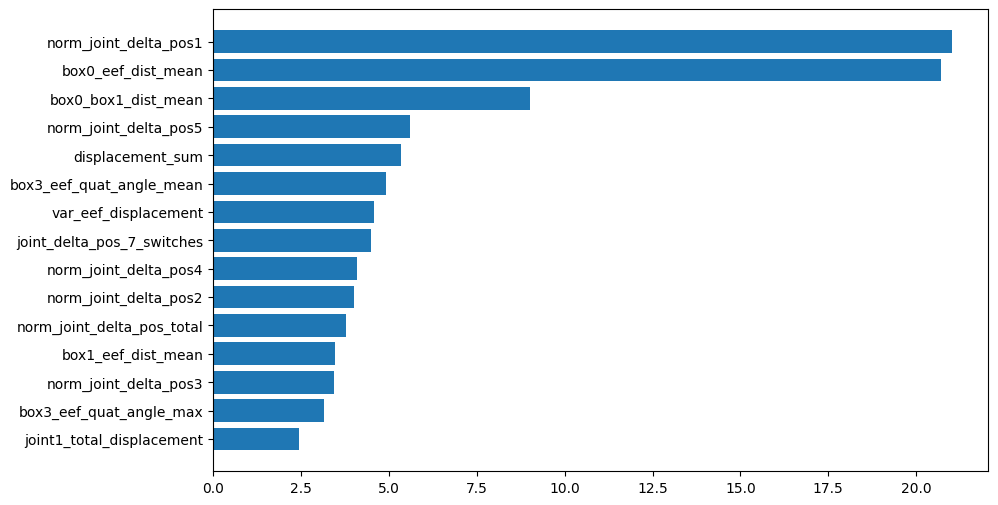

In [ ]:
import matplotlib.pyplot as plt

feature_importances = catboost.get_feature_importance()
features = X_train[summary['selected_features_names']].columns

feat_imp_df = pd.DataFrame({'feature': features, 'importance': feature_importances})
feat_imp_df = feat_imp_df.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10,6))
plt.barh(feat_imp_df['feature'], feat_imp_df['importance'])
plt.gca().invert_yaxis()
plt.show()


In [ ]:
catboost_model = results['catboost']['model']
svm_model = results['svm']['model']



## Final results

In [ ]:
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score

# Prepare lists to store results
models = []
train_r2_list = []
train_mse_list = []
test_r2_list = []
test_mse_list = []

# --- Linear model (forward selection) ---
X_train_forward = sm.add_constant(X_train[final_betas.index.values])
X_test_forward = sm.add_constant(X_test[final_betas.index.values])

forward_train_preds = final_model.predict(X_train_forward)
forward_test_preds = final_model.predict(X_test_forward)

models.append('Forward Selection')
train_r2_list.append(r2_score(y_train, forward_train_preds))
train_mse_list.append(mean_squared_error(y_train, forward_train_preds))
test_r2_list.append(r2_score(y_test, forward_test_preds))
test_mse_list.append(mean_squared_error(y_test, forward_test_preds))

# --- Lasso ---
models.append('Lasso')
train_r2_list.append(lasso_cv_model.score(X_train, y_train))
train_mse_list.append(mean_squared_error(y_train, lasso_cv_model.predict(X_train)))
test_r2_list.append(lasso_cv_model.score(X_test, y_test))
test_mse_list.append(mean_squared_error(y_test, lasso_cv_model.predict(X_test)))

# --- Ridge ---
models.append('Ridge')
train_r2_list.append(ridge_cv_model.score(X_train, y_train))
train_mse_list.append(mean_squared_error(y_train, ridge_cv_model.predict(X_train)))
test_r2_list.append(ridge_cv_model.score(X_test, y_test))
test_mse_list.append(mean_squared_error(y_test, ridge_cv_model.predict(X_test)))

# --- Random Forest ---
y_train_rf = rf_sqrt.predict(X_train)
y_test_rf = rf_sqrt.predict(X_test)

models.append('Random Forest')
train_r2_list.append(r2_score(y_train, y_train_rf))
train_mse_list.append(mean_squared_error(y_train, y_train_rf))
test_r2_list.append(r2_score(y_test, y_test_rf))
test_mse_list.append(mean_squared_error(y_test, y_test_rf))

# --- SVM ---
y_train_svm = svm_model.predict(X_train)
y_test_svm = svm_model.predict(X_test)

models.append('SVM')
train_r2_list.append(r2_score(y_train, y_train_svm))
train_mse_list.append(mean_squared_error(y_train, y_train_svm))
test_r2_list.append(r2_score(y_test, y_test_svm))
test_mse_list.append(mean_squared_error(y_test, y_test_svm))

# --- CatBoost ---
y_train_cb = catboost.predict(X_train[summary['selected_features_names']])
y_test_cb = catboost.predict(X_test[summary['selected_features_names']])

models.append('CatBoost')
train_r2_list.append(r2_score(y_train, y_train_cb))
train_mse_list.append(mean_squared_error(y_train, y_train_cb))
test_r2_list.append(r2_score(y_test, y_test_cb))
test_mse_list.append(mean_squared_error(y_test, y_test_cb))

# --- Build final report ---
report = pd.DataFrame({
    'Model': models,
    'Train R²': train_r2_list,
    'Train MSE': train_mse_list,
    'Test R²': test_r2_list,
    'Test MSE': test_mse_list,
})

# Pretty print
print(report.to_string(index=False))


            Model  Train R²  Train MSE  Test R²  Test MSE
Forward Selection  0.647913   0.027517 0.547772  0.031893
            Lasso  0.659209   0.026634 0.559495  0.031066
            Ridge  0.659137   0.026640 0.558859  0.031111
    Random Forest  0.949522   0.003945 0.577215  0.029816
              SVM  0.839291   0.012560 0.549360  0.031781
         CatBoost  0.863458   0.010671 0.633676  0.025834


In [ ]:
report # without logged

,Model,Train R²,Train MSE,Test R²,Test MSE
0,Forward Selection,0.647913,0.027517,0.547772,0.031893
1,Lasso,0.659209,0.026634,0.559495,0.031066
2,Ridge,0.659137,0.026640,0.558859,0.031111
3,Random Forest,0.949522,0.003945,0.577215,0.029816
4,SVM,0.839291,0.012560,0.549360,0.031781
5,CatBoost,0.863458,0.010671,0.633676,0.025834


#Classification Task

In [ ]:
median_timestamp = df['logged_max_of_timestamp'].median()
df['Class'] = (df['logged_max_of_timestamp'] > median_timestamp).astype(int)

In [ ]:
counts = df['Class'].value_counts()
counts

,count
Class,
0,404
1,396


In [ ]:
df.groupby('Class').mean().T.head(10)  # Transposed for easier reading

Class,0,1
max_of_timestamp,2.238944,3.551768
displacement_sum,0.277175,-0.282774
var_eef_displacement,0.321233,-0.327723
norm_joint_delta_pos1,0.437511,-0.446350
norm_joint_delta_pos2,-0.298436,0.304465
norm_joint_delta_pos3,0.000379,-0.000386
norm_joint_delta_pos4,-0.071486,0.072930
norm_joint_delta_pos5,0.175768,-0.179319
norm_joint_delta_pos6,-0.179457,0.183082
norm_joint_delta_pos7,0.310390,-0.316661


In [ ]:
y = df['Class']
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp', 'log_max_of_timestamp'], errors='ignore')

In [ ]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Bagging with Decision Tree
bag = BaggingClassifier(estimator=DecisionTreeClassifier(),
                        n_estimators=100,
                        bootstrap=True,
                        oob_score=True,
                        random_state=42)
bag.fit(X_train, y_train)
y_pred_bag = bag.predict(X_test)

# Random Forest
rf = RandomForestClassifier(n_estimators=100, bootstrap=True, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

In [ ]:
from sklearn.svm import SVC

# Train Linear SVM
svm_linear = SVC(kernel='linear', random_state=42)
svm_linear.fit(X, y)
y_pred_svm = svm_linear.predict(X_test)

# Extract weights and bias
w = svm_linear.coef_[0]
b = svm_linear.intercept_[0]
feature_names = X.columns.tolist()

# Print the linear decision function
terms = [f"{w[i]:+0.3f}·x{i+1}" for i in range(len(w))]
equation = " + ".join(terms) + f" {b:+.3f}"
print("\nLinear SVM Decision Function:")
print(f"f(x) = {equation}")

# Feature explanation table
print("\n🧾 Feature Explanation Table:")
print(f"{'xᵢ':<5} {'Feature Name':<40} {'Weight':>10}")
print("-" * 60)
for i, (name, coef) in enumerate(zip(feature_names, w)):
    print(f"x{i+1:<3} {name:<40} {coef:>+10.4f}")



Linear SVM Decision Function:
f(x) = -0.787·x1 + +0.199·x2 + -1.048·x3 + +0.154·x4 + -0.250·x5 + -0.035·x6 + +0.152·x7 + -0.428·x8 + -0.778·x9 + +0.840·x10 + +0.123·x11 + +1.422·x12 + +0.195·x13 + +0.204·x14 + -0.367·x15 + -0.572·x16 + +0.485·x17 + -0.491·x18 + +0.141·x19 + +0.472·x20 + -0.038·x21 + +0.138·x22 + -0.161·x23 + +0.654·x24 + -0.342·x25 + -0.264·x26 + +0.267·x27 + +0.032·x28 + -0.713·x29 + -0.242·x30 + +0.219·x31 + -0.314·x32 + +0.548·x33 + +0.057·x34 + +0.125·x35 + +0.056·x36 + -0.020·x37 + -0.045·x38 + -0.062·x39 + -0.007·x40 + -0.010·x41 + +0.124·x42 +0.697

🧾 Feature Explanation Table:
xᵢ    Feature Name                                 Weight
------------------------------------------------------------
x1   displacement_sum                            -0.7869
x2   var_eef_displacement                        +0.1987
x3   norm_joint_delta_pos1                       -1.0479
x4   norm_joint_delta_pos2                       +0.1536
x5   norm_joint_delta_pos3                 

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np
import pandas as pd # Import pandas if df is not globally available

# Use your real dataset
# Ensure 'Class' is your target variable. If it's 'is_above_median', adjust here.
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp', 'log_max_of_timestamp'], errors='ignore')
y = df['Class']
feature_names = X.columns.tolist()


# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# --- Gradient Boosting Classifier ---
print("\n=== Gradient Boosting Classifier ===")

# Initialize the Gradient Boosting model
# Common hyperparameters to start with:
# n_estimators: number of boosting stages (trees)
# learning_rate: shrinks the contribution of each tree
# max_depth: maximum depth of the individual regression estimators
model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Cross-validated accuracy
scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
print(f"\n→ Accuracy scores (Cross-Validation): {np.round(scores, 4)}")
print(f"→ Mean accuracy: {scores.mean():.4f}")
print(f"→ Std deviation: {scores.std():.4f}")

# 🔁 Refit on full data to extract interpretation info (e.g., Feature Importances)
model.fit(X, y)

# --- Interpretability for Gradient Boosting ---
# Gradient Boosting models provide feature importances, which indicate the
# relative importance of each feature in predicting the target variable.
feature_importances = model.feature_importances_

# Create a DataFrame for better display
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print("\n📊 Feature Importances (Higher is more important):")
print(importance_df)

# You can also visualize these importances, for example:
# import matplotlib.pyplot as plt
# import seaborn as sns
# plt.figure(figsize=(10, 6))
# sns.barplot(x='Importance', y='Feature', data=importance_df)
# plt.title('Feature Importances for Gradient Boosting Classifier')
# plt.tight_layout()
# plt.show()


=== Gradient Boosting Classifier ===

→ Accuracy scores (Cross-Validation): [0.8    0.8125 0.8188 0.8375 0.8312]
→ Mean accuracy: 0.8200
→ Std deviation: 0.0133

📊 Feature Importances (Higher is more important):
                       Feature  Importance
11          box0_eef_dist_mean    0.381388
2        norm_joint_delta_pos1    0.164334
32         box0_box1_dist_mean    0.060282
9   norm_joint_delta_pos_total    0.047980
31     box3_eef_quat_angle_max    0.031285
0             displacement_sum    0.024242
6        norm_joint_delta_pos5    0.023433
28     box2_eef_quat_angle_max    0.023198
1         var_eef_displacement    0.018032
3        norm_joint_delta_pos2    0.017155
25     box1_eef_quat_angle_max    0.016982
22     box0_eef_quat_angle_max    0.015036
41   joint1_total_displacement    0.015026
10  joint_delta_pos_7_switches    0.012999
7        norm_joint_delta_pos6    0.012290
13          box1_eef_dist_mean    0.012213
4        norm_joint_delta_pos3    0.011495
5        norm

In [ ]:
# Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, # Number of boosting stages (trees)
                                learning_rate=0.1, # Step size shrinkage
                                max_depth=3, # Maximum depth of individual trees
                                random_state=42)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)

In [ ]:
# Print results
print(f"Accuracy - Bagging: {accuracy_score(y_test, y_pred_bag):.2%}")
print(f"OOB Score - Bagging: {bag.oob_score_:.2%}")
print(f"Accuracy - Random Forest: {accuracy_score(y_test, y_pred_rf):.2%}")
print(f"Accuracy - SVM: {accuracy_score(y_test, y_pred_svm):.2%}")
print(f"Gradient Boosting Accuracy: {accuracy_score(y_test, y_pred_gb):.2%}")

Accuracy - Bagging: 79.50%
OOB Score - Bagging: 81.17%
Accuracy - Random Forest: 81.50%
Accuracy - SVM: 84.50%
Gradient Boosting Accuracy: 81.50%


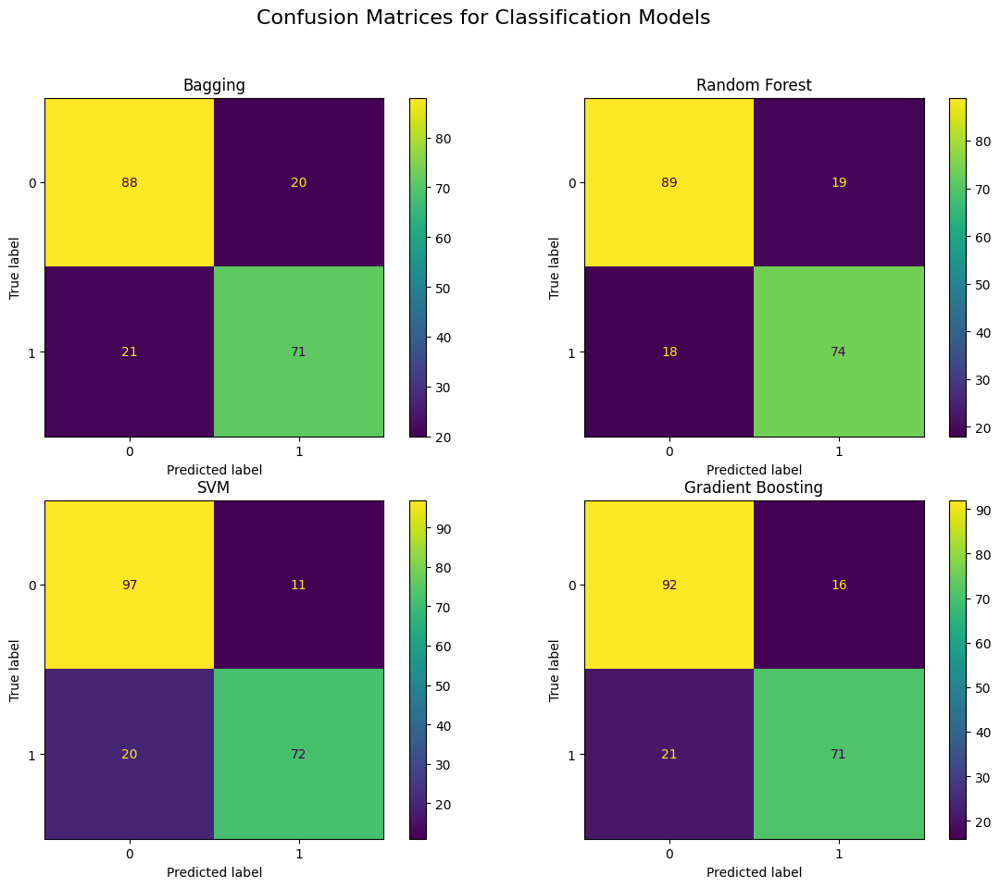

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, confusion_matrix

# Plot confusion matrices in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(12, 10)) # Changed to 2x2 subplots with adjusted figsize
fig.suptitle("Confusion Matrices for Classification Models", fontsize=16) # Increased font size for title

# Bagging (Top-left)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_bag), display_labels=[0, 1]).plot(ax=axes[0, 0], values_format='d')
axes[0, 0].set_title("Bagging")

# Random Forest (Top-right)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_rf), display_labels=[0, 1]).plot(ax=axes[0, 1], values_format='d')
axes[0, 1].set_title("Random Forest")

# SVM (Bottom-left)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_svm), display_labels=[0, 1]).plot(ax=axes[1, 0], values_format='d')
axes[1, 0].set_title("SVM")

# Gradient Boosting (Bottom-right)
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_gb), display_labels=[0, 1]).plot(ax=axes[1, 1], values_format='d')
axes[1, 1].set_title("Gradient Boosting")

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect to prevent title overlap
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

metrics = {}

metrics['Bagging'] = {
    'Accuracy': accuracy_score(y_test, y_pred_bag),
    'Precision': precision_score(y_test, y_pred_bag),
    'Recall': recall_score(y_test, y_pred_bag),
    'F1-Score': f1_score(y_test, y_pred_bag)
}

metrics['Random Forest'] = {
    'Accuracy': accuracy_score(y_test, y_pred_rf),
    'Precision': precision_score(y_test, y_pred_rf),
    'Recall': recall_score(y_test, y_pred_rf),
    'F1-Score': f1_score(y_test, y_pred_rf)
}

metrics['SVM'] = {
    'Accuracy': accuracy_score(y_test, y_pred_svm),
    'Precision': precision_score(y_test, y_pred_svm),
    'Recall': recall_score(y_test, y_pred_svm),
    'F1-Score': f1_score(y_test, y_pred_svm)
}

metrics['Gradient Boosting'] = {
    'Accuracy': accuracy_score(y_test, y_pred_gb),
    'Precision': precision_score(y_test, y_pred_gb),
    'Recall': recall_score(y_test, y_pred_gb),
    'F1-Score': f1_score(y_test, y_pred_gb)
}

metrics_df = pd.DataFrame.from_dict(metrics, orient='index')

print("\n--- Classification Model Performance Metrics ---")
print(metrics_df.round(4))


--- Classification Model Performance Metrics ---
                   Accuracy  Precision  Recall  F1-Score
Bagging               0.795     0.7802  0.7717    0.7760
Random Forest         0.815     0.7957  0.8043    0.8000
SVM                   0.845     0.8675  0.7826    0.8229
Gradient Boosting     0.815     0.8161  0.7717    0.7933


In [ ]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np


# Define SVM kernels to test
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate each kernel
for kernel in kernels:
    print(f"\n🔍 SVM Kernel: {kernel.upper()}")

    # Initialize model
    if kernel == 'poly':
        model = SVC(kernel=kernel, degree=3)
    else:
        model = SVC(kernel=kernel)

    # Cross-validated accuracy
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    print(f"→ Accuracy scores: {np.round(scores, 4)}")
    print(f"→ Mean accuracy: {scores.mean():.4f}")
    print(f"→ Std deviation: {scores.std():.4f}")

    # 🔁 Refit on full data to inspect hyperplane / support vectors
    model.fit(X, y)

    if kernel == 'linear':
        w = model.coef_[0]
        b = model.intercept_[0]
        print(f"→ Linear hyperplane equation:")
        terms = [f"{w[i]:+.3f}·x{i+1}" for i in range(len(w))]
        equation = " + ".join(terms) + f" {b:+.3f}"
        print(f"f(x) = {equation}")

    else:
        sv = model.support_vectors_
        dual_coefs = model.dual_coef_[0]
        intercept = model.intercept_[0]
        n_sv = len(sv)

        print(f"→ Number of support vectors: {n_sv}")
        print(f"→ Intercept (b): {intercept:.3f}")
        print("→ Decision function structure:")

        if kernel == 'rbf':
            print(r"f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b")
        elif kernel == 'poly':
            print(r"f(x) = Σ αᵢ·yᵢ·(γ·xᵢᵗ·x + coef0)^degree + b")
        elif kernel == 'sigmoid':
            print(r"f(x) = Σ αᵢ·yᵢ·tanh(γ·xᵢᵗ·x + coef0) + b")
        print("  (evaluated using support vectors)")


🔍 SVM Kernel: LINEAR
→ Accuracy scores: [0.8188 0.7812 0.8375 0.8312 0.825 ]
→ Mean accuracy: 0.8187
→ Std deviation: 0.0198
→ Linear hyperplane equation:
f(x) = -0.787·x1 + +0.199·x2 + -1.048·x3 + +0.154·x4 + -0.250·x5 + -0.035·x6 + +0.152·x7 + -0.428·x8 + -0.778·x9 + +0.840·x10 + +0.123·x11 + +1.422·x12 + +0.195·x13 + +0.204·x14 + -0.367·x15 + -0.572·x16 + +0.485·x17 + -0.491·x18 + +0.141·x19 + +0.472·x20 + -0.038·x21 + +0.138·x22 + -0.161·x23 + +0.654·x24 + -0.342·x25 + -0.264·x26 + +0.267·x27 + +0.032·x28 + -0.713·x29 + -0.242·x30 + +0.219·x31 + -0.314·x32 + +0.548·x33 + +0.057·x34 + +0.125·x35 + +0.056·x36 + -0.020·x37 + -0.045·x38 + -0.062·x39 + -0.007·x40 + -0.010·x41 + +0.124·x42 +0.697

🔍 SVM Kernel: RBF
→ Accuracy scores: [0.7812 0.7875 0.8562 0.8625 0.8562]
→ Mean accuracy: 0.8287
→ Std deviation: 0.0364
→ Number of support vectors: 460
→ Intercept (b): 0.834
→ Decision function structure:
f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b
  (evaluated using support vectors)

🔍 SVM Ker

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np

# Use your real dataset
y = df['Class']
X = df.drop(columns=['max_of_timestamp', 'Class', 'episode_index', 'logged_max_of_timestamp'], errors='ignore')
feature_names = X.columns.tolist()

# Define SVM kernels to test
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# Setup cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate each kernel
for kernel in kernels:
    print(f"\n🔍 SVM Kernel: {kernel.upper()}")

    # Initialize model
    if kernel == 'poly':
        model = SVC(kernel=kernel, degree=3)
    else:
        model = SVC(kernel=kernel)

    # Cross-validated accuracy
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    print(f"→ Accuracy scores: {np.round(scores, 4)}")
    print(f"→ Mean accuracy: {scores.mean():.4f}")
    print(f"→ Std deviation: {scores.std():.4f}")

    # 🔁 Refit on full data to extract interpretation info
    model.fit(X, y)

    if kernel == 'linear':
        # Linear hyperplane: wᵀx + b
        w = model.coef_[0]
        b = model.intercept_[0]
        print(f"\n→ Linear hyperplane equation:")
        terms = [f"{w[i]:+.3f}·x{i+1}" for i in range(len(w))]
        equation = " + ".join(terms) + f" {b:+.3f}"
        print(f"f(x) = {equation}")

        # Print feature explanation table
        print("\n🧾 Feature Explanation Table:")
        print(f"{'xᵢ':<5} {'Feature Name':<40}")
        print("-" * 50)
        for i, name in enumerate(feature_names):
            print(f"x{i+1:<3} {name:<40}")

    else:
        # Nonlinear SVM: kernel-based decision function
        sv = model.support_vectors_
        dual_coefs = model.dual_coef_[0]
        intercept = model.intercept_[0]
        n_sv = len(sv)

        print(f"→ Number of support vectors: {n_sv}")
        print(f"→ Intercept (b): {intercept:.3f}")
        print("→ Decision function structure:")

        if kernel == 'rbf':
            print(r"f(x) = Σ αᵢ·yᵢ·exp(-γ·||xᵢ - x||²) + b")
        elif kernel == 'poly':
            print(r"f(x) = Σ αᵢ·yᵢ·(γ·xᵢᵗ·x + coef0)^degree + b")
        elif kernel == 'sigmoid':
            print(r"f(x) = Σ αᵢ·yᵢ·tanh(γ·xᵢᵗ·x + coef0) + b")
        print("  (evaluated using support vectors)")



🔍 SVM Kernel: LINEAR
→ Accuracy scores: [0.8188 0.7812 0.8375 0.8312 0.825 ]
→ Mean accuracy: 0.8187
→ Std deviation: 0.0198

→ Linear hyperplane equation:
f(x) = -0.787·x1 + +0.199·x2 + -1.048·x3 + +0.154·x4 + -0.250·x5 + -0.035·x6 + +0.152·x7 + -0.428·x8 + -0.778·x9 + +0.840·x10 + +0.123·x11 + +1.422·x12 + +0.195·x13 + +0.204·x14 + -0.367·x15 + -0.572·x16 + +0.485·x17 + -0.491·x18 + +0.141·x19 + +0.472·x20 + -0.038·x21 + +0.138·x22 + -0.161·x23 + +0.654·x24 + -0.342·x25 + -0.264·x26 + +0.267·x27 + +0.032·x28 + -0.713·x29 + -0.242·x30 + +0.219·x31 + -0.314·x32 + +0.548·x33 + +0.057·x34 + +0.125·x35 + +0.056·x36 + -0.020·x37 + -0.045·x38 + -0.062·x39 + -0.007·x40 + -0.010·x41 + +0.124·x42 +0.697

🧾 Feature Explanation Table:
xᵢ    Feature Name                            
--------------------------------------------------
x1   displacement_sum                        
x2   var_eef_displacement                    
x3   norm_joint_delta_pos1                   
x4   norm_joint_delta_pos2  